This notebook is split into two sections. The first part includes the code that finds the optimal combination of (T,K) and in the second part trains the library of source models. The whole pipeline including both sections is run at the very end where you can see every step

Libraries

In [3]:
import os
import numpy as np
import pandas as pd
import pickle
import random
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import gpytorch
from gpytorch.models import ExactGP
from gpytorch.means import ConstantMean
from gpytorch.kernels import RBFKernel, MaternKernel, ScaleKernel, AdditiveKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.mlls import ExactMarginalLogLikelihood
from sklearn.preprocessing import MinMaxScaler, normalize
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import NearestCentroid
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import (mean_absolute_error, r2_score, mean_squared_error,
                            silhouette_score, davies_bouldin_score, calinski_harabasz_score)
from scipy.stats import f_oneway
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
def setup_environment(seed=42, data_dir=r"..."):

    os.chdir(data_dir)

    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(f"Device: {device}")
    if device == 'cuda':
        print(f"GPU: {torch.cuda.get_device_name(0)}")
        print(f"Memory: {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB")
        torch.cuda.empty_cache()

    return device

DATA LOADING AND PROCESSING

In [5]:
def load_wind_data(filepath):

    print(f"Loading wind data from {filepath}")

    df = pd.read_csv(filepath)
    df.rename(columns={'Unnamed: 0': 'ID', 'time': 'Time'}, inplace=True)

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce')
    df = df.sort_values('Time').reset_index(drop=True)

    df = df[(df['Time'] >= '2018-01-01') & (df['Time'] <= '2020-01-01')]

    df['Power'] = pd.to_numeric(df['Power'], errors='coerce')

    df['Month'] = df['Time'].dt.month
    df['Hour'] = df['Time'].dt.hour

    for lag in [1, 2, 3]:
        df[f'Power_t-{lag}'] = df['Power'].shift(lag)
        df[f'Windspeed_t-{lag}'] = df['Windspeed'].shift(lag)

    print(f"  Loaded: {len(df)} hours")
    print(f"  Power range: {df['Power'].min():.1f} - {df['Power'].max():.1f} MW")
    print(f"  Power mean: {df['Power'].mean():.1f} MW ± {df['Power'].std():.1f} MW")

    return df

EXTRACT TIMESERIES MATRIX

In [ ]:
def extract_timeseries(df, time_period_hours=24):

    if 'Turn_off' in df.columns:
        initial_len = len(df)
        df = df[df['Turn_off'] == 1].copy()
        print(f"  Filtered 'Turn Off' events: Dropped {initial_len - len(df)} rows")

    df = df.sort_values('Time').reset_index(drop=True)


    df['Hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['Hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)

    if 'Wind_Direction' in df.columns:
        df['Wind_Direction_sin'] = np.sin(2 * np.pi * df['Wind_Direction'] / 360)
        df['Wind_Direction_cos'] = np.cos(2 * np.pi * df['Wind_Direction'] / 360)
    df['Month_sin'] = np.sin(2 * np.pi * df['Month'] / 12)
    df['Month_cos'] = np.cos(2 * np.pi * df['Month'] / 12)

    full_features = [
        'Power', 'Windspeed', 'Wind_Direction', 'fsr', 'u100', 'v100',
        'Power_t-1', 'Power_t-2', 'Power_t-3',
        'Windspeed_t-1', 'Windspeed_t-2', 'Windspeed_t-3',
        'Hour_sin', 'Hour_cos', 'Wind_Direction_sin', 'Wind_Direction_cos',
        'Month_sin', 'Month_cos'
    ]

    vae_features = [
        'Windspeed', 'fsr', 'u100', 'v100',
        'Wind_Direction_sin', 'Wind_Direction_cos'
    ]

    for feature in full_features:
        if feature not in df.columns:
            if not (feature.endswith('_sin') or feature.endswith('_cos')):
                df[feature] = 0

    valid_periods = []

    expected_duration = pd.Timedelta(hours=time_period_hours - 1)


    for i in range(0, len(df) - time_period_hours + 1, time_period_hours):

        start_time = df['Time'].iloc[i]
        end_time = df['Time'].iloc[i + time_period_hours - 1]

        if (end_time - start_time) == expected_duration:
            valid_periods.append(i)

    n_periods = len(valid_periods)

    if n_periods == 0:
        print(f"  Warning: No continuous {time_period_hours}-hour periods found.")
        return np.array([]), np.array([]), []


    n_full_features = len(full_features)
    n_vae_features = len(vae_features)

    timeseries_full = np.zeros((n_periods, n_full_features, time_period_hours))
    timeseries_vae = np.zeros((n_periods, n_vae_features, time_period_hours))

    full_data = df[full_features].values
    vae_data = df[vae_features].values

    for idx, start_idx in enumerate(valid_periods):
        timeseries_full[idx] = full_data[start_idx:start_idx+time_period_hours].T
        timeseries_vae[idx] = vae_data[start_idx:start_idx+time_period_hours].T

    # Create period info
    period_info = []
    farm_id = df['farm_id'].iloc[0] if 'farm_id' in df.columns else 'Unknown'

    for idx, start_idx in enumerate(valid_periods):
        end_idx = start_idx + time_period_hours
        period_slice = df.iloc[start_idx:end_idx]

        period_info.append({
            'period_id': idx,
            'start_time': period_slice['Time'].iloc[0],
            'end_time': period_slice['Time'].iloc[-1],
            'mean_power': period_slice['Power'].mean(),
            'std_power': period_slice['Power'].std(),
            'mean_wind': period_slice['Windspeed'].mean(),
            'std_wind': period_slice['Windspeed'].std(),
            'month': period_slice['Month'].iloc[0],
            'farm_id': farm_id
        })

    skipped = (len(df) // time_period_hours) - n_periods
    print(f"  Extracted: {n_periods} periods (skipped {skipped} discontinuous blocks)")
    print(f"  Full: {timeseries_full.shape}, VAE: {timeseries_vae.shape}")

    return timeseries_full, timeseries_vae, period_info

SPLITTING INTO TRAIN/TEST

In [7]:
def split_timeperiods(timeseries_matrix, period_info, test_ratio=0.2, random_state=42):

    n_periods = len(timeseries_matrix)
    np.random.seed(random_state)
    all_indices = np.arange(n_periods)
    np.random.shuffle(all_indices)

    split_point = int((1 - test_ratio) * n_periods)
    train_indices = sorted(all_indices[:split_point])
    test_indices = sorted(all_indices[split_point:])

    train_timeseries = timeseries_matrix[train_indices]
    test_timeseries = timeseries_matrix[test_indices]
    train_period_info = [period_info[i] for i in train_indices]
    test_period_info = [period_info[i] for i in test_indices]
    train_farm_ids = np.array([info['farm_id'] for info in train_period_info])
    test_farm_ids = np.array([info['farm_id'] for info in test_period_info])

    print(f"Timeseries randomly split into {len(train_indices)} train periods and {len(test_indices)} test periods")

    return {
        'train_timeseries': train_timeseries,
        'test_timeseries': test_timeseries,
        'train_period_info': train_period_info,
        'test_period_info': test_period_info,
        'train_indices': train_indices,
        'test_indices': test_indices,
        'train_farm_ids': train_farm_ids,
        'test_farm_ids': test_farm_ids
    }

NORMALISING

In [8]:
def normalise_timeseries(train_timeseries, test_timeseries, feature_names, log_features=['fsr']):

    scalers = {}
    log_transforms = {}
    train_normalised = train_timeseries.copy().astype(np.float32)
    test_normalised = test_timeseries.copy().astype(np.float32)

    cyclical_features = ['sin', 'cos']

    for ch in range(train_timeseries.shape[1]):

        channel_name = feature_names[ch] if ch < len(feature_names) else f'Channel_{ch}'

        if any(cyc in channel_name for cyc in cyclical_features):
            continue


        train_channel_data = train_timeseries[:, ch, :].flatten()
        test_channel_data = test_timeseries[:, ch, :].flatten()

        if channel_name in log_features:
            train_channel_data = np.log(train_channel_data)
            test_channel_data = np.log(test_channel_data)
            log_transforms[channel_name] = True
        else:
            log_transforms[channel_name] = False

        scaler = MinMaxScaler(feature_range=(-1, 1))
        scaler.fit(train_channel_data.reshape(-1, 1))

        train_scaled = scaler.transform(train_channel_data.reshape(-1, 1)).flatten()
        train_normalised[:, ch, :] = train_scaled.reshape(train_timeseries.shape[0], -1)

        test_scaled = scaler.transform(test_channel_data.reshape(-1, 1)).flatten()
        test_normalised[:, ch, :] = test_scaled.reshape(test_timeseries.shape[0], -1)

        scalers[channel_name] = scaler

    return train_normalised, test_normalised, scalers, log_transforms

VAE SET-UP

In [9]:
class TimeSeriesVAE(nn.Module):
    def __init__(self, input_dim=6, sequence_length=24, latent_dim=8, hidden_dim=128):
        super(TimeSeriesVAE, self).__init__()
        self.input_dim = input_dim
        self.sequence_length = sequence_length
        self.latent_dim = latent_dim
        self.hidden_dim = hidden_dim

        self.encoder_conv = nn.Sequential(
            nn.Conv1d(input_dim, 64, kernel_size=5, padding=2),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Conv1d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128),
            nn.ReLU()
        )

        self.encoder_lstm = nn.LSTM(128, hidden_dim // 2, batch_first=True, bidirectional=True)
        self.encoder_fc = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.2)
        )

        self.fc_mu = nn.Linear(hidden_dim, latent_dim)
        self.fc_logvar = nn.Linear(hidden_dim, latent_dim)

        self.decoder_fc = nn.Sequential(
            nn.Linear(latent_dim, hidden_dim),
            nn.ReLU()
        )

        self.decoder_lstm = nn.LSTM(hidden_dim, 128, batch_first=True)

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose1d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.ConvTranspose1d(64, input_dim, kernel_size=5, padding=2)
        )

        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, (nn.Linear, nn.Conv1d, nn.ConvTranspose1d)):
            nn.init.kaiming_uniform_(module.weight, nonlinearity='relu')
            if module.bias is not None:
                module.bias.data.zero_()

    def encode(self, x):
        h = self.encoder_conv(x)
        h = h.permute(0, 2, 1)
        h, _ = self.encoder_lstm(h)
        h = h[:, -1, :]
        h = self.encoder_fc(h)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h = self.decoder_fc(z)
        h = h.unsqueeze(1).repeat(1, self.sequence_length, 1)
        h, _ = self.decoder_lstm(h)
        h = h.permute(0, 2, 1)
        return self.decoder_conv(h)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon_x = self.decode(z)
        return recon_x, mu, logvar, z

In [10]:
class WindPowerDataset(Dataset):
    def __init__(self, timeseries_matrix):
        self.data = timeseries_matrix.astype(np.float32)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return torch.from_numpy(self.data[idx])

In [11]:
def vae_loss_function(recon_x, x, mu, logvar, beta=0.5):

    recon_loss = nn.MSELoss(reduction='mean')(recon_x, x)
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    kl_loss = torch.clamp(kl_loss, max=1000.0)
    kl_loss /= x.size(0) * x.size(1) * x.size(2)
    total_loss = recon_loss + beta * kl_loss

    return total_loss, recon_loss, kl_loss

TRAIN VAE

In [12]:
def seed_worker(worker_id):
        worker_seed = torch.initial_seed() % 2**32
        np.random.seed(worker_seed)
        random.seed(worker_seed)

In [ ]:
def train_vae(train_normalised_vae, latent_dim=8, epochs=200, batch_size=64, vae_save_path=None, device='cuda'):

    torch.manual_seed(84)
    torch.cuda.manual_seed(84)
    np.random.seed(84)
    random.seed(84)

    if vae_save_path and os.path.exists(vae_save_path):
        vae = TimeSeriesVAE(train_normalised_vae.shape[1],
                           train_normalised_vae.shape[2], latent_dim).to(device)
        vae.load_state_dict(torch.load(vae_save_path, map_location=device))
        vae.eval()
        print(f"VAE loaded from {vae_save_path}")
        return vae

    print(f"Training VAE (latent_dim={latent_dim}, epochs={epochs})")
    vae = TimeSeriesVAE(train_normalised_vae.shape[1], train_normalised_vae.shape[2], latent_dim).to(device)

    dataset = WindPowerDataset(train_normalised_vae)

    g = torch.Generator()
    g.manual_seed(42)

    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True, worker_init_fn=seed_worker, generator=g)
    optimizer = optim.AdamW(vae.parameters(), lr=3e-4, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    vae.train()
    best_loss = float('inf')
    patience_counter = 0

    for epoch in range(epochs):
        epoch_loss = 0
        batch_count = 0

        beta = min(1.0, 0.01 + (epoch / (epochs * 0.5)) * 0.99)

        for batch in dataloader:
            batch = batch.to(device, non_blocking=True)
            optimizer.zero_grad()
            recon_batch, mu, logvar, z = vae(batch)
            total_loss, recon_loss, kl_loss = vae_loss_function(recon_batch, batch, mu, logvar, beta=beta)

            if torch.isnan(total_loss) or torch.isinf(total_loss):
                continue

            total_loss.backward()
            torch.nn.utils.clip_grad_norm_(vae.parameters(), max_norm=1.0)
            optimizer.step()

            epoch_loss += total_loss.item()
            batch_count += 1

        if batch_count == 0:
            continue

        epoch_loss /= batch_count
        scheduler.step()

        if epoch_loss < best_loss:
            best_loss = epoch_loss
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter > 30:
            print(f"    Early stopping at epoch {epoch}")
            break

        if (epoch + 1) % 25 == 0:
            print(f"  Epoch {epoch+1:3d}: Loss={epoch_loss:.4f}, β={beta:.3f}")

    print(f"  VAE training completed. Best loss: {best_loss:.4f}")

    if vae_save_path is not None:
        torch.save(vae.state_dict(), vae_save_path)
        print(f"  VAE model saved to {vae_save_path}")

    return vae

EXTRACT VAE LATENT FEATURES

In [ ]:
def extract_vae_features(vae, normalised_vae, device='cuda'):

    vae.eval()
    vae = vae.to(device)

    use_workers = 0 if device == 'cpu' else 4
    use_pin_memory = False if device == 'cpu' else True

    dataset = WindPowerDataset(normalised_vae)
    dataloader = DataLoader(dataset, batch_size=64, shuffle=False, num_workers=use_workers, pin_memory=use_pin_memory)
    latent_codes = []

    with torch.no_grad():
        for batch in dataloader:
            batch = batch.to(device, non_blocking=True)
            mu, logvar = vae.encode(batch)
            z = mu 
            latent_codes.append(z.cpu().numpy())

    latent_matrix = np.vstack(latent_codes)

    if device == 'cuda':
        torch.cuda.empty_cache()

    return latent_matrix

CLUSTER IN THE LATENT SPACE

In [ ]:
def cluster_training_latent_space(train_latent_features, k_clusters=6):

    print(f"Clustering {train_latent_features.shape[0]} training periods into {k_clusters} clusters")

    train_latent_norm = normalize(train_latent_features, norm='l2')
    clustering_model = AgglomerativeClustering(n_clusters=k_clusters, linkage='ward', metric='euclidean')
    train_cluster_labels = clustering_model.fit_predict(train_latent_norm)

    unique_clusters, counts = np.unique(train_cluster_labels, return_counts=True)
    min_size = 10

    for cluster_id in list(unique_clusters):
        idx = np.where(unique_clusters == cluster_id)[0][0]
        if counts[idx] < min_size:
            small_mask = train_cluster_labels == cluster_id
            if np.sum(small_mask) == 0:
                continue
            small_centroid = np.mean(train_latent_norm[small_mask], axis=0)
            other_ids = unique_clusters[unique_clusters != cluster_id]
            other_centroids = [np.mean(train_latent_norm[train_cluster_labels == c], axis=0) for c in other_ids]
            distances = np.linalg.norm(np.array(other_centroids) - small_centroid, axis=1)
            nearest_cluster = other_ids[np.argmin(distances)]
            train_cluster_labels[small_mask] = nearest_cluster

    unique_clusters, counts = np.unique(train_cluster_labels, return_counts=True)
    for cluster_id, size in zip(unique_clusters, counts):
        print(f"  Cluster {cluster_id}: {size} periods")

    return train_cluster_labels

ASSIGN CLUSTERS TO TEST SET

In [16]:
def assign_test_clusters(train_latent_features, test_latent_features, train_cluster_labels):
    print(f"Assigning test periods to clusters")
    print(f"  Test latent features Shape: {test_latent_features.shape}")

    train_norm = normalize(train_latent_features, norm='l2')
    test_norm = normalize(test_latent_features, norm='l2')

    centroid_classifier = NearestCentroid(metric='euclidean')
    centroid_classifier.fit(train_norm, train_cluster_labels)
    test_cluster_labels = centroid_classifier.predict(test_norm)

    unique_clusters = np.unique(train_cluster_labels)
    for cluster_id in unique_clusters:
        test_count = np.sum(test_cluster_labels == cluster_id)
        print(f"  Cluster {cluster_id}: {test_count} test periods")

    return test_cluster_labels

CLUSTERTING METRICS

In [ ]:
def evaluate_clustering_quality(train_latent_features, train_cluster_labels, test_cluster_labels, train_period_info, test_period_info, train_timeseries=None):

    train_unique_clusters, train_counts = np.unique(train_cluster_labels, return_counts=True)
    test_counts = np.array([np.sum(test_cluster_labels == c) for c in train_unique_clusters])

    # Internal Clustering Metrics (on latent features)
    silhouette = silhouette_score(train_latent_features, train_cluster_labels) if len(train_unique_clusters) > 1 else 0
    davies_bouldin = davies_bouldin_score(train_latent_features, train_cluster_labels) if len(train_unique_clusters) > 1 else 2.0  # High DB is bad
    ch_score = calinski_harabasz_score(train_latent_features, train_cluster_labels) if len(train_unique_clusters) > 1 else 0

    # Normalise for scoring 
    db_normalised = max(0, (2.0 - davies_bouldin) / 2.0)
    ch_normalised = min(1, np.log1p(ch_score) / np.log1p(10000))


    # Meteorological Separation (between-cluster differences in weather features)
    features = ['mean_wind', 'std_wind', 'std_power']
    f_stats = []
    for feature in features:
        feature_groups = []
        for cluster_id in train_unique_clusters:
            cluster_indices = np.where(train_cluster_labels == cluster_id)[0]
            feature_values = [train_period_info[i][feature] for i in cluster_indices if feature in train_period_info[i]]
            if len(feature_values) > 1:
                feature_groups.append(np.array(feature_values))
        if len(feature_groups) > 1 and all(len(g) > 1 for g in feature_groups):
            f_stat, _ = f_oneway(*feature_groups)
            f_stats.append(f_stat)
    meteo_separation = np.mean(f_stats) if f_stats else 0
    meteo_normalised = min(1, np.log1p(meteo_separation) / 10)


    #  Intra-cluster time series similarity
    temporal_coherence = 0
    if train_timeseries is not None:
        temporal_scores = []
        for cluster_id in train_unique_clusters:
            mask = train_cluster_labels == cluster_id
            if np.sum(mask) < 3:
                continue
            cluster_ts = train_timeseries[mask]
            correlations = []
            for i in range(min(len(cluster_ts), 10)):
                for j in range(i + 1, min(len(cluster_ts), 10)):
                    corr = np.corrcoef(cluster_ts[i].flatten(), cluster_ts[j].flatten())[0, 1]
                    if not np.isnan(corr):
                        correlations.append(corr)
            if correlations:
                temporal_scores.append(np.mean(correlations))
        temporal_coherence = np.mean(temporal_scores) if temporal_scores else 0


    #  Distribution Consistency
    if len(train_unique_clusters) >= 2:
        train_props = train_counts / np.sum(train_counts)
        test_props = test_counts / np.sum(test_counts)
        m = (train_props + test_props) / 2
        js_div = 0.5 * np.sum(train_props * np.log(train_props / (m + 1e-10) + 1e-10)) + \
                 0.5 * np.sum(test_props * np.log(test_props / (m + 1e-10) + 1e-10))
        distribution_consistency = max(0, 1 - js_div)
    else:
        distribution_consistency = 0

    #  Quality Score
    weights = [0.2, 0.2, 0.2, 0.25, 0.1, 0.05]
    components = [max(0, silhouette), db_normalised, ch_normalised, meteo_normalised,
                 max(0, temporal_coherence), distribution_consistency]
    quality_score = np.sum([w * c for w, c in zip(weights, components)])

    return {
        'silhouette_score': silhouette,
        'davies_bouldin_score': davies_bouldin,
        'calinski_harabasz_score': ch_score,
        'meteo_separation': meteo_separation,
        'temporal_coherence': temporal_coherence,
        'distribution_consistency': distribution_consistency,
        'n_clusters': len(train_unique_clusters),
        'quality_score': quality_score
    }

In [ ]:
def plot_clusters(best_combination, save_prefix=None):

    train_ts = best_combination['train_normalised_full']
    test_ts = best_combination['test_normalised_full']
    all_ts = np.vstack([train_ts, test_ts])

    train_labels = best_combination['train_cluster_labels']
    test_labels = best_combination['test_cluster_labels']
    all_labels = np.concatenate([train_labels, test_labels])

    scalers = best_combination['scalers_full']

    idx_wind = 1
    idx_sin = 13
    idx_cos = 14


    # Plot 1: Wind Speed Distribution

    raw_wind = all_ts[:, idx_wind, :]
    if scalers.get('Windspeed'):
        s = raw_wind.shape
        raw_wind = scalers['Windspeed'].inverse_transform(raw_wind.reshape(-1, 1)).reshape(s)

    mean_wind_per_sample = np.mean(raw_wind, axis=1)
    df_plot = pd.DataFrame({
        'Period-Average Wind Speed (m/s)': mean_wind_per_sample,
        'Cluster': all_labels
    })

    publication_palette = sns.color_palette("deep")
    fig1, ax1 = plt.subplots(figsize=(20, 16))

    sns.kdeplot(data=df_plot, x="Period-Average Wind Speed (m/s)", hue="Cluster",
                fill=True, common_norm=False, palette=publication_palette,
                alpha=0.25, linewidth=2.5, ax=ax1)

    ax1.set_title("Distribution of Mean Wind Speed by Cluster", fontsize=40, y=1.02)
    ax1.set_xlabel("Mean Wind Speed (m/s) over Time Period", fontsize=38)
    ax1.set_ylabel("Density Probability", fontsize=38)
    ax1.tick_params(axis='both', which='major', labelsize=34)
    plt.ylim(0, 0.2)
    ax1.grid(True, which='major', linestyle='--', alpha=0.5)
    sns.despine(ax=ax1, offset=5, trim=True)
    sns.move_legend(ax1, "upper right", title='Clusters', fontsize=40, frameon=True, shadow=False)
    leg = ax1.get_legend()
    leg.get_title().set_fontsize(40)

    if save_prefix:
        save_name_1 = f"{save_prefix}_wind_speed_distribution.png"
        plt.savefig(save_name_1, dpi=300)
        print(f"Saved Wind Speed plot to: {save_name_1}")
    plt.show()


    # Plot 2: Wind Direction Roses

    raw_sin = all_ts[:, idx_sin, :]
    raw_cos = all_ts[:, idx_cos, :]
    avg_sin = np.mean(raw_sin, axis=1)
    avg_cos = np.mean(raw_cos, axis=1)
    angles_rad = np.arctan2(avg_sin, avg_cos)

    unique_clusters = np.sort(np.unique(all_labels))
    n_clusters = len(unique_clusters)
    cols = 4
    rows = int(np.ceil(n_clusters / cols))

    fig2 = plt.figure(figsize=(20, 5 * rows))

    for i, cluster_id in enumerate(unique_clusters):
        ax = fig2.add_subplot(rows, cols, i+1, projection='polar')
        mask = all_labels == cluster_id
        cluster_angles = angles_rad[mask]

        counts, bin_edges = np.histogram(cluster_angles, bins=16, range=(-np.pi, np.pi))
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        width = (2*np.pi) / 16
        color = publication_palette[i % len(publication_palette)]

        ax.bar(bin_centers, counts, width=width, bottom=0.0, color=color, alpha=0.7, edgecolor='white')
        ax.set_theta_zero_location("N")
        ax.set_theta_direction(-1)
        ax.set_title(f"Cluster {cluster_id}\n(n={np.sum(mask)})", fontweight='bold', y=1.1)
        ax.set_yticks([])

        mean_angle_cluster = np.arctan2(np.mean(np.sin(cluster_angles)), np.mean(np.cos(cluster_angles)))
        ax.arrow(mean_angle_cluster, 0, 0, np.max(counts)*0.8,
                color='black', width=0.05, head_width=0.2, alpha=0.8, zorder=10)

    plt.suptitle("Wind Direction by Cluster", fontsize=16, y=1.02)
    plt.tight_layout()

    if save_prefix:
        save_name_2 = f"{save_prefix}_wind_roses.png"
        plt.savefig(save_name_2, dpi=300)
        print(f"Saved Wind Rose plot to: {save_name_2}")
    plt.show()

In [ ]:
def plot_latent_clusters(best_combination, save_path=None):

    sns.set_theme(style="white", context="paper", font_scale=1.2)

    latent_matrix = best_combination['train_latent']
    labels = best_combination['train_cluster_labels']

    print("Computing t-SNE...")
    tsne = TSNE(n_components=2, perplexity=50, random_state=42, init='pca', learning_rate='auto')
    z_embedded = tsne.fit_transform(latent_matrix)

    df_plot = pd.DataFrame({'x': z_embedded[:, 0], 'y': z_embedded[:, 1], 'Cluster': labels})
    publication_palette = sns.color_palette("deep")

    plt.figure(figsize=(20, 16))

    sns.kdeplot(data=df_plot, x='x', y='y', hue='Cluster',
                fill=True, palette=publication_palette, alpha=0.2,
                thresh=0.05, levels=2, legend=False, linewidth=0)

    sns.kdeplot(data=df_plot, x='x', y='y', hue='Cluster',
                fill=False, palette=publication_palette, alpha=0.7,
                thresh=0.05, levels=2, legend=False, linewidths=2.5)

    sns.scatterplot(data=df_plot, x='x', y='y', hue='Cluster',
                   palette=publication_palette, alpha=0.5, s=15, linewidth=0, legend=False)

   # plt.title("Clusters Projected in the Latent Space", fontsize=24, fontweight='bold', y=1.02)
    plt.axis('off')

    if save_path:
        plt.savefig(save_path, dpi=300)
    plt.show()

FIND OPTIMAL COMBINATION OF (T,K) - FULL RUN THROUGH

In [ ]:
def find_optimal_configuration(df, time_period_grid=[6, 12, 24], k_clusters_grid=[6, 8],
                               latent_dim=8, test_ratio=0.2, epochs=200, random_state=84, device='cuda'):

    print(f"\n{'='*120}")
    print("OPTIMAL CONFIGURATION SEARCH")
    print(f"{'='*120}\n")

    years_used = (df['Time'].max() - df['Time'].min()).days / 365.25
    all_combinations = {}
    vae_save_dir = r"/content"
    os.makedirs(vae_save_dir, exist_ok=True)

    for time_period_hours in time_period_grid:
        print(f"\nProcessing {time_period_hours}h periods...")

        all_full_arrays = []
        all_vae_arrays = []
        all_info_list = []

        for farm_name, farm_data in df.groupby('farm_id'):

            full_ts, vae_ts, info = extract_timeseries(farm_data, time_period_hours)

            if len(full_ts) > 0:
                all_full_arrays.append(full_ts)
                all_vae_arrays.append(vae_ts)
                all_info_list.extend(info)

        if not all_full_arrays:
            print(f"  Warning: No valid {time_period_hours}h periods found for any farm. Skipping...")
            continue

        timeseries_matrix_full = np.concatenate(all_full_arrays, axis=0)
        timeseries_matrix_vae = np.concatenate(all_vae_arrays, axis=0)
        period_info = all_info_list

        split_data = split_timeperiods(timeseries_matrix_vae, period_info, test_ratio, random_state)

        train_indices = split_data['train_indices']
        test_indices = split_data['test_indices']
        train_timeseries_full = timeseries_matrix_full[train_indices]
        test_timeseries_full = timeseries_matrix_full[test_indices]

        vae_feature_names = ['Windspeed', 'fsr', 'u100', 'v100', 'wind_dir_sin', 'wind_dir_cos']

        train_normalised_vae, test_normalised_vae, scalers_vae, log_transforms_vae = normalise_timeseries(
            split_data['train_timeseries'], split_data['test_timeseries'], vae_feature_names)


        full_feature_names = ['Power', 'Windspeed', 'fsr', 'u100', 'v100',
                             'Power_t-1', 'Power_t-2', 'Power_t-3',
                             'Windspeed_t-1', 'Windspeed_t-2', 'Windspeed_t-3',
                             'hour_sin', 'hour_cos', 'wind_dir_sin', 'wind_dir_cos',
                             'month_sin', 'month_cos']

        train_normalised_full, test_normalised_full, scalers_full, log_transforms_full = normalise_timeseries(
            train_timeseries_full, test_timeseries_full, full_feature_names)


        vae_save_path = os.path.join(vae_save_dir, f"vae_config_{time_period_hours}h_{years_used:.1f}y.pth")
        vae = train_vae(train_normalised_vae, latent_dim, epochs, vae_save_path=vae_save_path, device=device)

        train_latent_features = extract_vae_features(vae, train_normalised_vae, device)
        test_latent_features = extract_vae_features(vae, test_normalised_vae, device)

        for k_clusters in k_clusters_grid:
            print(f"  Testing k={k_clusters}...", end=" ")

            try:
                train_cluster_labels = cluster_training_latent_space(train_latent_features, k_clusters)
                test_cluster_labels = assign_test_clusters(train_latent_features, test_latent_features, train_cluster_labels)

                clustering_metrics = evaluate_clustering_quality(
                    train_latent_features, train_cluster_labels, test_cluster_labels,
                    split_data['train_period_info'], split_data['test_period_info'], train_normalised_vae)

                combined_score = clustering_metrics['quality_score']
                print(f"Score: {combined_score:.3f}")

                all_combinations[(time_period_hours, k_clusters)] = {
                    'time_period_hours': time_period_hours,
                    'k_clusters': k_clusters,
                    'combined_score': combined_score,
                    'clustering_metrics': clustering_metrics,
                    'vae': vae,
                    'train_latent': train_latent_features,
                    'test_latent': test_latent_features,
                    'train_cluster_labels': train_cluster_labels,
                    'test_cluster_labels': test_cluster_labels,
                    'split_data': split_data,
                    'train_normalised_vae': train_normalised_vae,
                    'test_normalised_vae': test_normalised_vae,
                    'train_normalised_full': train_normalised_full,
                    'test_normalised_full': test_normalised_full,
                    'train_indices': train_indices,
                    'test_indices': test_indices,
                    'scalers_vae': scalers_vae,
                    'log_transforms_vae': log_transforms_vae,
                    'scalers_full': scalers_full,
                    'log_transforms_full': log_transforms_full,
                    'train_farm_ids': split_data['train_farm_ids'],
                    'test_farm_ids': split_data['test_farm_ids'],
                    'train_period_info': split_data['train_period_info'],
                    'test_period_info': split_data['test_period_info']
                }
            except Exception as e:
                print(f"Failed: {e}")
                continue

    save_path = fr"/content/all_combinations_{years_used:.1f}.pkl"
    with open(save_path, 'wb') as f:
        pickle.dump(all_combinations, f)

    if not all_combinations:
        raise ValueError("No valid combinations found")

    best_key = max(all_combinations.keys(), key=lambda k: all_combinations[k]['combined_score'])
    optimal_config = all_combinations[best_key]

    print(f"\nBEST CONFIGURATION:")
    print(f"  Time Period: {optimal_config['time_period_hours']}h")
    print(f"  Clusters: {optimal_config['k_clusters']}")
    print(f"  Score: {optimal_config['combined_score']:.3f}")

    return optimal_config

CREATE DATASETS

In [ ]:
def create_cluster_forecasting_datasets(latent_features, normalised_timeseries_data, cluster_labels, period_indices, period_info, forecast_horizon=1):

    unique_clusters = np.unique(cluster_labels)
    cluster_datasets = {}

    period_mask = np.zeros(len(cluster_labels), dtype=bool)
    valid_indices = period_indices[period_indices < len(cluster_labels)]
    period_mask[valid_indices] = True

    # Feature indices in full timeseries matrix
    feature_indices = {
        'power': 0,
        'windspeed': 1,
        'fsr': 2,
        'u100': 3,
        'v100': 4,
        'power_t1': 5,
        'power_t2': 6,
        'power_t3': 7,
        'windspeed_t1': 8,
        'windspeed_t2': 9,
        'windspeed_t3': 10,
        'hour_sin': 11,
        'hour_cos': 12,
        'wind_dir_sin': 13,
        'wind_dir_cos': 14,
        'month_sin': 15,
        'month_cos': 16
    }

    for cluster_id in unique_clusters:
        cluster_mask = cluster_labels == cluster_id
        combined_mask = cluster_mask & period_mask
        selected_indices = np.where(combined_mask)[0]

        if len(selected_indices) < 5:
            continue

        cluster_latent = latent_features[selected_indices]
        cluster_timeseries = normalised_timeseries_data[selected_indices]

        X_cluster = []
        y_cluster = []
        period_idx_mapping = []

        for local_idx, (vae_features, period_data) in enumerate(zip(cluster_latent, cluster_timeseries)):

            original_period_idx = selected_indices[local_idx]

            # Extract feature arrays using indices
            power_values = period_data[feature_indices['power'], :]
            power_t1_values = period_data[feature_indices['power_t1'], :]
            power_t2_values = period_data[feature_indices['power_t2'], :]
            windspeed_values = period_data[feature_indices['windspeed'], :]
            windspeed_t1_values = period_data[feature_indices['windspeed_t1'], :]
            windspeed_t2_values = period_data[feature_indices['windspeed_t2'], :]

            # Cyclical features
            hour_sin_values = period_data[feature_indices['hour_sin'], :]
            hour_cos_values = period_data[feature_indices['hour_cos'], :]
            month_sin_values = period_data[feature_indices['month_sin'], :]
            month_cos_values = period_data[feature_indices['month_cos'], :]
            wind_dir_sin_values = period_data[feature_indices['wind_dir_sin'], :]
            wind_dir_cos_values = period_data[feature_indices['wind_dir_cos'], :]

            # Additional weather features
            fsr_values = period_data[feature_indices['fsr'], :]

            for hour in range(len(power_values) - forecast_horizon):
                features = []

                # VAE latent features (8 features)
                features.extend(vae_features.tolist())

                # Lagged power features
                features.extend([
                    power_t1_values[hour],
                    power_t2_values[hour]
                ])

                # Lagged wind features
                features.extend([
                    windspeed_t1_values[hour],
                    windspeed_t2_values[hour]
                ])

                # Current weather conditions    - Current Power not used for realism
                features.extend([
                    windspeed_values[hour],
                    fsr_values[hour]
                ])

                # Cyclical temporal features
                features.extend([
                    hour_sin_values[hour],
                    hour_cos_values[hour],
                    month_sin_values[hour],
                    month_cos_values[hour]
                ])

                # Cyclical wind direction
                features.extend([
                    wind_dir_sin_values[hour],
                    wind_dir_cos_values[hour]
                ])

                # Target
                y_target = power_values[hour + forecast_horizon]

                X_cluster.append(features)
                y_cluster.append(y_target)
                period_idx_mapping.append(original_period_idx)

        if len(X_cluster) == 0:
            continue

        X_cluster = np.array(X_cluster, dtype=np.float32)
        y_cluster = np.array(y_cluster, dtype=np.float32)

        feature_names = [
                'latent_0', 'latent_1', 'latent_2', 'latent_3',
                'latent_4', 'latent_5', 'latent_6', 'latent_7',
                'power_t1', 'power_t2',
                'windspeed_t1', 'windspeed_t2',
                'windspeed', 'fsr',
                'hour_sin', 'hour_cos', 'month_sin', 'month_cos',
                'wind_dir_sin', 'wind_dir_cos'
            ]

        cluster_datasets[cluster_id] = {
                'X': X_cluster,
                'y': y_cluster,
                'n_periods': len(cluster_latent),
                'n_samples': len(X_cluster),
                'n_features': X_cluster.shape[1],
                'feature_names': feature_names,
                'period_indices': selected_indices.tolist(),
                'period_idx_mapping': period_idx_mapping
            }

        print(f"Cluster {cluster_id}: {len(cluster_latent)} periods, {len(X_cluster)} samples, {X_cluster.shape[1]} features")

    return cluster_datasets

TRAIN GP MODELS

In [22]:
class GPModel(ExactGP):

    def __init__(self, train_x, train_y, likelihood):
        super(GPModel, self).__init__(train_x, train_y, likelihood)
        self.mean_module = ConstantMean()
        self.covar_module = ScaleKernel(
            AdditiveKernel(
                RBFKernel(ard_num_dims=train_x.shape[1]),
                MaternKernel(nu=1.5, ard_num_dims=train_x.shape[1])
            )
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

In [ ]:
def train_gpytorch_model(X_train, y_train, training_iterations=100, device='cuda', mask_ratio=0.5):

    if mask_ratio > 0:
        n_samples = len(X_train)
        keep_size = int(n_samples * (1 - mask_ratio))
        keep_size = max(keep_size, 10)

        indices = np.random.choice(n_samples, keep_size, replace=False)
        X_train_sparse = X_train[indices]
        y_train_sparse = y_train[indices]

    else:
        X_train_sparse = X_train
        y_train_sparse = y_train


    train_x = torch.FloatTensor(X_train_sparse.astype(np.float32)).to(device)
    train_y = torch.FloatTensor(y_train_sparse.astype(np.float32)).to(device)

    likelihood = GaussianLikelihood().to(device)
    model = GPModel(train_x, train_y, likelihood).to(device)

    model.train()
    likelihood.train()

    optimizer = torch.optim.Adam(model.parameters(), lr=0.1)
    mll = ExactMarginalLogLikelihood(likelihood, model)

    best_loss = float('inf')
    patience_counter = 0

    for i in range(training_iterations):
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)

        if torch.isnan(loss) or torch.isinf(loss):
            break

        loss.backward()

        if loss.item() < best_loss:
            best_loss = loss.item()
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= 15: 
            break

        optimizer.step()

    return model, likelihood

In [24]:
def predict_gpytorch_model(model, likelihood, X_test, device='cuda', batch_size=1024):

    model.eval()
    likelihood.eval()

    n_samples = X_test.shape[0]
    all_means = []
    all_stds = []

    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        for i in range(0, n_samples, batch_size):
            batch_end = min(i + batch_size, n_samples)
            test_x_batch = torch.FloatTensor(X_test[i:batch_end]).to(device)
            predictions = likelihood(model(test_x_batch))
            all_means.append(predictions.mean.cpu().numpy())
            all_stds.append(predictions.stddev.cpu().numpy())

    return np.concatenate(all_means), np.concatenate(all_stds)

In [ ]:
def train_cluster_gp_models(train_cluster_datasets, test_cluster_datasets, train_period_info, test_period_info, scalers=None,
                            device='cuda', training_iterations=100, mask_ratio=0.5):

    if device == 'cuda' and not torch.cuda.is_available():
        print("CUDA not available, using CPU")
        device = 'cpu'

    farm_capacities = {
        'Beatrice': 588, 'Hornsea': 1218, 'Walney': 649,
        'Baltic': 475, 'Gode': 582, 'Iles': 496
    }

    cluster_models = {}
    power_scaler = scalers.get('Power') if scalers else None
    total_clusters = len([c for c in train_cluster_datasets.keys() if c in test_cluster_datasets])
    cluster_idx = 0

    print(f"\nTraining Source GPs with {mask_ratio*100:.0f}% Random Masking ...")

    for cluster_id in sorted(train_cluster_datasets.keys()):
        if cluster_id not in test_cluster_datasets:
            continue

        cluster_idx += 1
        print(f"[{cluster_idx}/{total_clusters}] Training Cluster {cluster_id}...", end=" ", flush=True)

        train_data = train_cluster_datasets[cluster_id]
        test_data = test_cluster_datasets[cluster_id]

        X_train = train_data['X']
        y_train = train_data['y']
        X_test = test_data['X']
        y_test = test_data['y']

        max_samples = 22000
        if len(X_train) > max_samples:
            np.random.seed(42)
            subsample_idx = np.random.choice(len(X_train), max_samples, replace=False)
            X_train = X_train[subsample_idx]
            y_train = y_train[subsample_idx]

        if len(X_train) < 20 or len(X_test) < 2:
            print(f"Skipped (insufficient data)")
            continue

        test_sample_farm_ids = np.array([test_period_info[idx]['farm_id']
                                         for idx in test_data['period_idx_mapping']])

        try:
            model, likelihood = train_gpytorch_model(X_train, y_train, training_iterations, device, mask_ratio=mask_ratio)

            y_pred_scaled, y_std_scaled = predict_gpytorch_model(model, likelihood, X_test, device)

            if power_scaler is not None:
                y_pred_original = power_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
                y_test_original = power_scaler.inverse_transform(y_test.reshape(-1, 1)).ravel()

                data_range = power_scaler.data_max_[0] - power_scaler.data_min_[0]
                feature_range = 2.0
                y_std_original = y_std_scaled * (data_range / feature_range)

                y_pred_original = np.clip(y_pred_original, 0, max(farm_capacities.values()))

                mae = mean_absolute_error(y_test_original, y_pred_original)
                r2 = r2_score(y_test_original, y_pred_original)
                rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_original))

                farm_metrics = {}
                for farm_id in np.unique(test_sample_farm_ids):
                    farm_mask = test_sample_farm_ids == farm_id
                    n_farm_samples = np.sum(farm_mask)
                    if n_farm_samples == 0: continue

                    farm_id_clean = farm_id.strip()
                    farm_capacity = farm_capacities.get(farm_id_clean, None)

                    if farm_capacity:
                        farm_y_test = y_test_original[farm_mask]
                        farm_y_pred = y_pred_original[farm_mask]
                        farm_mae = mean_absolute_error(farm_y_test, farm_y_pred)
                        farm_metrics[farm_id] = {
                            'mae': farm_mae,
                            'mae_pct': (farm_mae / farm_capacity) * 100,
                            'rmse': np.sqrt(mean_squared_error(farm_y_test, farm_y_pred)),
                            'r2': r2_score(farm_y_test, farm_y_pred) if n_farm_samples >= 2 else np.nan,
                            'n_samples': int(n_farm_samples),
                            'capacity': farm_capacity
                        }

                metrics = {
                    'mae': mae, 'r2': r2, 'rmse': rmse,
                    'farm_metrics': farm_metrics,
                    'predictions_original': y_pred_original,
                    'actual_original': y_test_original,
                    'uncertainties_original': y_std_original,
                    'n_train': len(X_train),
                    'n_test': len(X_test)
                }

                print(f" MAE: {mae:.1f} MW, R²: {r2:.3f}")
            else:
                metrics = {
                    'mae_norm': mean_absolute_error(y_test, y_pred_scaled),
                    'r2_norm': r2_score(y_test, y_pred_scaled),
                    'n_train': len(X_train),
                    'n_test': len(X_test)
                }
                print(f" (normalised metrics)")

            cluster_models[cluster_id] = {
                'gp_model': model,
                'likelihood': likelihood,
                'power_scaler': power_scaler,
                'metrics': metrics,
                'device': device
            }

            if device == 'cuda':
                torch.cuda.empty_cache()

        except Exception as e:
            print(f" Error: {str(e)}")
            import traceback
            traceback.print_exc()
            if device == 'cuda':
                torch.cuda.empty_cache()
            continue

    return cluster_models

TRAIN BASELINE MODELS

In [26]:
def train_cluster_baseline_models(train_cluster_datasets, test_cluster_datasets, train_period_info, test_period_info, scalers=None):

    farm_capacities = {
        'Beatrice': 588,
        'Hornsea': 1218,
        'Walney': 649,
        'Baltic': 475,
        'Gode': 582,
        'Iles': 496
    }

    cluster_baseline_results = {}
    power_scaler = scalers.get('Power') if scalers else None

    # Progress tracking
    total_clusters = len([c for c in train_cluster_datasets.keys() if c in test_cluster_datasets])
    cluster_idx = 0

    for cluster_id in sorted(train_cluster_datasets.keys()):
        if cluster_id not in test_cluster_datasets:
            continue

        cluster_idx += 1
        print(f"  [{cluster_idx}/{total_clusters}] Training Cluster {cluster_id} baselines... ", end="", flush=True)

        train_data = train_cluster_datasets[cluster_id]
        test_data = test_cluster_datasets[cluster_id]

        X_train = train_data['X']
        y_train = train_data['y']
        X_test = test_data['X']
        y_test = test_data['y']

        if len(X_train) < 50 or len(X_test) < 10:
            print(f"Skipped (insufficient data)")
            continue

        test_sample_farm_ids = np.array([test_period_info[idx]['farm_id']
                                         for idx in test_data['period_idx_mapping']])
        cluster_results = {}

        try:
            for model_type, model_class in [('Random Forest', RandomForestRegressor(n_estimators=100, max_depth=15, random_state=42)),
                                           ('Linear Regression', LinearRegression())]:
                model_class.fit(X_train, y_train)
                pred = model_class.predict(X_test)

                if power_scaler is not None:
                    pred_original = power_scaler.inverse_transform(pred.reshape(-1, 1)).ravel()
                    y_test_original = power_scaler.inverse_transform(y_test.reshape(-1, 1)).ravel()
                    pred_original = np.clip(pred_original, 0, max(farm_capacities.values()))

                    mae = mean_absolute_error(y_test_original, pred_original)
                    r2 = r2_score(y_test_original, pred_original)
                    rmse = np.sqrt(mean_squared_error(y_test_original, pred_original))

                    farm_metrics = {}
                    for farm_id in np.unique(test_sample_farm_ids):
                        farm_mask = test_sample_farm_ids == farm_id
                        n_farm_samples = np.sum(farm_mask)
                        if n_farm_samples == 0:
                            continue

                        farm_capacity = farm_capacities.get(farm_id, None)
                        if farm_capacity:
                            farm_y_test = y_test_original[farm_mask]
                            farm_y_pred = pred_original[farm_mask]
                            farm_mae = mean_absolute_error(farm_y_test, farm_y_pred)
                            farm_metrics[farm_id] = {
                                'mae': farm_mae,
                                'mae_pct': (farm_mae / farm_capacity) * 100,
                                'rmse': np.sqrt(mean_squared_error(farm_y_test, farm_y_pred)),
                                'r2': r2_score(farm_y_test, farm_y_pred) if n_farm_samples >= 2 else np.nan,
                                'n_samples': int(n_farm_samples),
                                'capacity': farm_capacity
                            }

                    cluster_results[model_type] = {
                        'mae': mae, 'r2': r2, 'rmse': rmse,
                        'farm_metrics': farm_metrics,
                        'predictions': pred_original,
                        'actual': y_test_original,
                        'n_train': len(X_train),
                        'n_test': len(X_test)
                    }

            cluster_baseline_results[cluster_id] = cluster_results
            print(f" RF: {cluster_results['Random Forest']['mae']:.1f} MW, LR: {cluster_results['Linear Regression']['mae']:.1f} MW")

        except Exception as e:
            print(f" Error: {str(e)}")
            continue

    return cluster_baseline_results

COMPARE RESULTS

In [ ]:
def create_results_comparison_table(cluster_gp_models, cluster_baseline_results):

    print(f"\n{'='*120}")
    print("PERFORMANCE RESULTS")
    print(f"{'='*120}")

    print(f"\n{'Cluster':<10} {'Model':<18} {'Test Samples':<15} {'MAE (MW)':<12} {'RMSE (MW)':<12} {'R²':<10}")
    print("-"*120)

    all_clusters = sorted(set(cluster_gp_models.keys()) | set(cluster_baseline_results.keys()))

    for cluster_id in all_clusters:
        if cluster_id in cluster_gp_models:
            gp_metrics = cluster_gp_models[cluster_id]['metrics']
            print(f"{cluster_id:<10} {'GP':<18} {gp_metrics['n_test']:<15} "
                  f"{gp_metrics['mae']:<12.1f} {gp_metrics['rmse']:<12.1f} {gp_metrics['r2']:<10.3f}")

        if cluster_id in cluster_baseline_results:
            for model_name in ['Random Forest', 'Linear Regression']:
                if model_name in cluster_baseline_results[cluster_id]:
                    metrics = cluster_baseline_results[cluster_id][model_name]
                    print(f"{cluster_id:<10} {model_name:<18} {metrics['n_test']:<15} "
                          f"{metrics['mae']:<12.1f} {metrics['rmse']:<12.1f} {metrics['r2']:<10.3f}")
        print()

    print(f"\n{'='*120}")
    print("OVERALL WEIGHTED METRICS")
    print(f"{'='*120}\n")

    model_aggregated = {}
    for model_type in ['GP', 'Random Forest', 'Linear Regression']:
        model_aggregated[model_type] = {
            'total_absolute_error': 0,
            'total_squared_error': 0,
            'total_samples': 0,
            'all_actual': [],
            'all_predicted': []
        }

    for cluster_id in cluster_gp_models.keys():
        metrics = cluster_gp_models[cluster_id]['metrics']
        n = metrics['n_test']
        model_aggregated['GP']['total_absolute_error'] += metrics['mae'] * n
        model_aggregated['GP']['total_squared_error'] += (metrics['rmse'] ** 2) * n
        model_aggregated['GP']['total_samples'] += n
        if 'actual_original' in metrics:
            model_aggregated['GP']['all_actual'].extend(metrics['actual_original'])
            model_aggregated['GP']['all_predicted'].extend(metrics['predictions_original'])

    for cluster_id in cluster_baseline_results.keys():
        for model_name in ['Random Forest', 'Linear Regression']:
            if model_name in cluster_baseline_results[cluster_id]:
                metrics = cluster_baseline_results[cluster_id][model_name]
                n = metrics['n_test']
                model_aggregated[model_name]['total_absolute_error'] += metrics['mae'] * n
                model_aggregated[model_name]['total_squared_error'] += (metrics['rmse'] ** 2) * n
                model_aggregated[model_name]['total_samples'] += n
                if 'actual' in metrics:
                    model_aggregated[model_name]['all_actual'].extend(metrics['actual'])
                    model_aggregated[model_name]['all_predicted'].extend(metrics['predictions'])

    print(f"{'Model':<18} {'Total Samples':<15} {'Weighted MAE (MW)':<20} {'Weighted RMSE (MW)':<20} {'R²':<15}")
    print("-"*120)

    for model_type in ['GP', 'Random Forest', 'Linear Regression']:
        stats = model_aggregated[model_type]
        if stats['total_samples'] > 0:
            weighted_mae = stats['total_absolute_error'] / stats['total_samples']
            weighted_rmse = np.sqrt(stats['total_squared_error'] / stats['total_samples'])
            r2_overall = r2_score(stats['all_actual'], stats['all_predicted']) if len(stats['all_actual']) > 0 else np.nan
            display_name = 'GP' if model_type == 'GP' else model_type
            print(f"{display_name:<18} {stats['total_samples']:<15} "
                  f"{weighted_mae:<20.1f} {weighted_rmse:<20.1f} {r2_overall:<15.3f}")

    print(f"\n{'='*120}\n")

    return {'model_aggregated': model_aggregated}

In [ ]:
def create_mae_percent_capacity_table(cluster_gp_models, cluster_baseline_results):

    farm_capacities = {
        'Beatrice': 588,
        'Hornsea': 1218,
        'Walney': 649,
        'Baltic': 475,
        'Gode': 582,
        'Iles': 496
    }

    # Collect data for GPs
    gp_cluster_data = {}

    for cluster_id in sorted(cluster_gp_models.keys()):
        metrics = cluster_gp_models[cluster_id]['metrics']

        if 'farm_metrics' not in metrics:
            continue

        cluster_total_mae_pct_weighted = 0
        cluster_total_samples = 0
        farm_data = {}

        for farm_id, farm_stats in metrics['farm_metrics'].items():
            n_samples = farm_stats['n_samples']
            mae_pct = farm_stats['mae_pct']

            # Weighted contribution to cluster average
            cluster_total_mae_pct_weighted += mae_pct * n_samples
            cluster_total_samples += n_samples

            farm_data[farm_id] = {
                'mae_pct': mae_pct,
                'n_samples': n_samples,
                'capacity': farm_stats['capacity']
            }

        # Cluster weighted average MAE%
        cluster_avg_mae_pct = cluster_total_mae_pct_weighted / cluster_total_samples if cluster_total_samples > 0 else 0

        gp_cluster_data[cluster_id] = {
            'avg_mae_pct': cluster_avg_mae_pct,
            'total_samples': cluster_total_samples,
            'farms': farm_data
        }

    # Collect data for RF
    rf_cluster_data = {}

    for cluster_id in sorted(cluster_baseline_results.keys()):
        if 'Random Forest' not in cluster_baseline_results[cluster_id]:
            continue

        rf_metrics = cluster_baseline_results[cluster_id]['Random Forest']

        if 'farm_metrics' not in rf_metrics:
            continue

        cluster_total_mae_pct_weighted = 0
        cluster_total_samples = 0
        farm_data = {}

        for farm_id, farm_stats in rf_metrics['farm_metrics'].items():
            n_samples = farm_stats['n_samples']
            mae_pct = farm_stats['mae_pct']

            # Weighted contribution to cluster average
            cluster_total_mae_pct_weighted += mae_pct * n_samples
            cluster_total_samples += n_samples

            farm_data[farm_id] = {
                'mae_pct': mae_pct,
                'n_samples': n_samples,
                'capacity': farm_stats['capacity']
            }

        # Cluster weighted average MAE%
        cluster_avg_mae_pct = cluster_total_mae_pct_weighted / cluster_total_samples if cluster_total_samples > 0 else 0

        rf_cluster_data[cluster_id] = {
            'avg_mae_pct': cluster_avg_mae_pct,
            'total_samples': cluster_total_samples,
            'farms': farm_data
        }

    print(f"\n{'='*170}")
    print("MAE AS PERCENTAGE OF CAPACITY BY CLUSTER AND FARM (GP vs RF)")
    print(f"{'='*170}\n")

    farm_order = ['Baltic', 'Beatrice', 'Gode', 'Hornsea', 'Iles', 'Walney']

    print(f"{'Cluster':<10} {'GP MAE%':<12} {'RF MAE%':<12} {'Total n':<12} ", end="")
    for farm in farm_order:
        print(f"| {farm:<10} {'n':<10} ", end="")
    print()
    print("-" * 170)

    all_clusters = sorted(set(gp_cluster_data.keys()) | set(rf_cluster_data.keys()))

    overall_gp_weighted_sum = 0
    overall_gp_total_samples = 0
    overall_rf_weighted_sum = 0
    overall_rf_total_samples = 0

    farm_overall_gp = {farm: {'weighted_sum': 0, 'total_samples': 0} for farm in farm_order}
    farm_overall_rf = {farm: {'weighted_sum': 0, 'total_samples': 0} for farm in farm_order}

    for cluster_id in all_clusters:
        # GP data
        if cluster_id in gp_cluster_data:
            gp_data = gp_cluster_data[cluster_id]
            gp_avg_mae_pct = gp_data['avg_mae_pct']
            gp_total_n = gp_data['total_samples']

            # Accumulate for overall
            overall_gp_weighted_sum += gp_avg_mae_pct * gp_total_n
            overall_gp_total_samples += gp_total_n
        else:
            gp_avg_mae_pct = 0
            gp_total_n = 0

        # RF data
        if cluster_id in rf_cluster_data:
            rf_data = rf_cluster_data[cluster_id]
            rf_avg_mae_pct = rf_data['avg_mae_pct']
            rf_total_n = rf_data['total_samples']

            # Accumulate for overall
            overall_rf_weighted_sum += rf_avg_mae_pct * rf_total_n
            overall_rf_total_samples += rf_total_n
        else:
            rf_avg_mae_pct = 0
            rf_total_n = 0


        display_total_n = max(gp_total_n, rf_total_n)

        print(f"{cluster_id:<10} {gp_avg_mae_pct:<12.2f} {rf_avg_mae_pct:<12.2f} {display_total_n:<12} ", end="")


        for farm in farm_order:
            if cluster_id in gp_cluster_data and farm in gp_cluster_data[cluster_id]['farms']:
                farm_stats = gp_cluster_data[cluster_id]['farms'][farm]
                farm_mae_pct = farm_stats['mae_pct']
                farm_n = farm_stats['n_samples']

                farm_overall_gp[farm]['weighted_sum'] += farm_mae_pct * farm_n
                farm_overall_gp[farm]['total_samples'] += farm_n

                print(f"| {farm_mae_pct:<10.2f} {farm_n:<10} ", end="")
            else:
                print(f"| {'—':<10} {'—':<10} ", end="")

            if cluster_id in rf_cluster_data and farm in rf_cluster_data[cluster_id]['farms']:
                rf_farm_stats = rf_cluster_data[cluster_id]['farms'][farm]
                rf_farm_mae_pct = rf_farm_stats['mae_pct']
                rf_farm_n = rf_farm_stats['n_samples']

                farm_overall_rf[farm]['weighted_sum'] += rf_farm_mae_pct * rf_farm_n
                farm_overall_rf[farm]['total_samples'] += rf_farm_n

        print()

    # Overall row
    print("-" * 170)

    overall_gp_mae_pct = overall_gp_weighted_sum / overall_gp_total_samples if overall_gp_total_samples > 0 else 0
    overall_rf_mae_pct = overall_rf_weighted_sum / overall_rf_total_samples if overall_rf_total_samples > 0 else 0

    print(f"{'Overall':<10} {overall_gp_mae_pct:<12.2f} {overall_rf_mae_pct:<12.2f} {overall_gp_total_samples:<12} ", end="")

    for farm in farm_order:
        farm_gp_stats = farm_overall_gp[farm]
        if farm_gp_stats['total_samples'] > 0:
            farm_overall_gp_mae_pct = farm_gp_stats['weighted_sum'] / farm_gp_stats['total_samples']
            farm_total_samples = farm_gp_stats['total_samples']
            print(f"| {farm_overall_gp_mae_pct:<10.2f} {farm_total_samples:<10} ", end="")
        else:
            print(f"| {'—':<10} {'—':<10} ", end="")

    print()
    print(f"{'='*170}\n")

    return {
        'gp_overall_mae_pct': overall_gp_mae_pct,
        'rf_overall_mae_pct': overall_rf_mae_pct,
        'gp_cluster_data': gp_cluster_data,
        'rf_cluster_data': rf_cluster_data
    }

In [29]:
def plot_spider_diagram_mae_by_farm(cluster_gp_models, save_path=None):

    farm_names = ['Baltic', 'Beatrice', 'Gode', 'Hornsea', 'Iles', 'Walney']
    all_clusters = sorted(cluster_gp_models.keys())

    farm_cluster_data = {farm: {} for farm in farm_names}

    for cluster_id in all_clusters:
        metrics = cluster_gp_models[cluster_id]['metrics']
        if 'farm_metrics' not in metrics:
            continue
        for farm_id, farm_stats in metrics['farm_metrics'].items():
            farm_cluster_data[farm_id][cluster_id] = farm_stats['mae_pct']

    num_clusters = len(all_clusters)
    angles = np.linspace(0, 2 * np.pi, num_clusters, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(20, 16), subplot_kw=dict(projection='polar'))
    colors = plt.cm.Set2(np.linspace(0, 1, len(farm_names)))

    for farm_id, color in zip(farm_names, colors):
        values = []
        for cluster_id in all_clusters:
            if cluster_id in farm_cluster_data[farm_id]:
                values.append(farm_cluster_data[farm_id][cluster_id])
            else:
                values.append(np.nan)

        values_plot = values + values[:1]

        if not all(np.isnan(values)):
            mask = ~np.isnan(values_plot)
            angles_valid = np.array(angles)[mask]
            values_valid = np.array(values_plot)[mask]
            ax.plot(angles_valid, values_valid, 'o-', linewidth=2.5,
                   label=farm_id, color=color, markersize=8)
            ax.fill(angles, values_plot, alpha=0.1, color=color)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels([f'Cluster {c}' for c in all_clusters], fontsize=38)
    ax.set_ylim(2, 6.0)
    ax.set_yticks([2.0, 3.0, 4.0, 5.0, 6.0])
    ax.set_yticklabels(['2.0%', '3.0%', '4.0%', '5.0%', '6.0%'], fontsize=30)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

  #  ax.set_title('MAE as Percentage of Capacity by Cluster and Wind Farm',
  #               fontsize=15, fontweight='bold', pad=25)

    plt.legend(loc='upper left', bbox_to_anchor=(1.15, 1.0), fontsize=50, frameon=True, shadow=True)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Spider diagram saved to {save_path}")

    plt.show()

In [30]:
def plot_results(cluster_gp_models, cluster_baseline_results, save_path=None):

    clusters = sorted(set(cluster_gp_models.keys()) | set(cluster_baseline_results.keys()))

    fig, axes = plt.subplots(2, 3, figsize=(16, 10))

    # MAE Comparison
    x_pos = np.arange(len(clusters))
    width = 0.25

    gp_maes = [cluster_gp_models[c]['metrics']['mae'] if c in cluster_gp_models else np.nan for c in clusters]
    rf_maes = [cluster_baseline_results[c]['Random Forest']['mae']
              if c in cluster_baseline_results and 'Random Forest' in cluster_baseline_results[c] else np.nan
              for c in clusters]
    lr_maes = [cluster_baseline_results[c]['Linear Regression']['mae']
              if c in cluster_baseline_results and 'Linear Regression' in cluster_baseline_results[c] else np.nan
              for c in clusters]

    axes[0,0].bar(x_pos - width, gp_maes, width, label='GP (VAE)', alpha=0.8, color='red')
    axes[0,0].bar(x_pos, rf_maes, width, label='Random Forest', alpha=0.8, color='blue')
    axes[0,0].bar(x_pos + width, lr_maes, width, label='Linear Regression', alpha=0.8, color='green')
    axes[0,0].set_xlabel('Cluster')
    axes[0,0].set_ylabel('MAE (MW)')
    axes[0,0].set_title('MAE Comparison by Cluster')
    axes[0,0].set_xticks(x_pos)
    axes[0,0].set_xticklabels([f'C{c}' for c in clusters])
    axes[0,0].legend()
    axes[0,0].grid(True, alpha=0.3)

    # R² Comparison
    gp_r2s = [cluster_gp_models[c]['metrics']['r2'] if c in cluster_gp_models else np.nan for c in clusters]
    rf_r2s = [cluster_baseline_results[c]['Random Forest']['r2']
             if c in cluster_baseline_results and 'Random Forest' in cluster_baseline_results[c] else np.nan
             for c in clusters]
    lr_r2s = [cluster_baseline_results[c]['Linear Regression']['r2']
             if c in cluster_baseline_results and 'Linear Regression' in cluster_baseline_results[c] else np.nan
             for c in clusters]

    axes[0,1].bar(x_pos - width, gp_r2s, width, label='GP (VAE)', alpha=0.8, color='red')
    axes[0,1].bar(x_pos, rf_r2s, width, label='Random Forest', alpha=0.8, color='blue')
    axes[0,1].bar(x_pos + width, lr_r2s, width, label='Linear Regression', alpha=0.8, color='green')
    axes[0,1].set_xlabel('Cluster')
    axes[0,1].set_ylabel('R²')
    axes[0,1].set_title('R² Comparison by Cluster')
    axes[0,1].set_xticks(x_pos)
    axes[0,1].set_xticklabels([f'C{c}' for c in clusters])
    axes[0,1].legend()
    axes[0,1].grid(True, alpha=0.3)

    # Best Model per Cluster
    best_models = []
    best_maes = []
    colors_best = []

    for cluster_id in clusters:
        cluster_maes = {}
        if cluster_id in cluster_gp_models:
            cluster_maes['GP'] = cluster_gp_models[cluster_id]['metrics']['mae']
        if cluster_id in cluster_baseline_results:
            if 'Random Forest' in cluster_baseline_results[cluster_id]:
                cluster_maes['RF'] = cluster_baseline_results[cluster_id]['Random Forest']['mae']
            if 'Linear Regression' in cluster_baseline_results[cluster_id]:
                cluster_maes['LR'] = cluster_baseline_results[cluster_id]['Linear Regression']['mae']

        if cluster_maes:
            best_model = min(cluster_maes, key=cluster_maes.get)
            best_models.append(best_model)
            best_maes.append(cluster_maes[best_model])
            colors_best.append('red' if best_model == 'GP' else 'blue' if best_model == 'RF' else 'green')
        else:
            best_models.append('None')
            best_maes.append(0)
            colors_best.append('gray')

    bars = axes[0,2].bar(range(len(clusters)), best_maes, color=colors_best, alpha=0.8)
    axes[0,2].set_xlabel('Cluster')
    axes[0,2].set_ylabel('Best MAE (MW)')
    axes[0,2].set_title('Best Model per Cluster')
    axes[0,2].set_xticks(range(len(clusters)))
    axes[0,2].set_xticklabels([f'C{c}' for c in clusters])

    for i, (bar, model) in enumerate(zip(bars, best_models)):
        if model != 'None':
            axes[0,2].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                          model, ha='center', va='bottom', fontweight='bold')

    # Predictions vs Actual for each model
    plot_idx = 3
    for model_type, color in [('GP', 'red'), ('Random Forest', 'blue'), ('Linear Regression', 'green')]:
        ax = axes[plot_idx // 3, plot_idx % 3]

        all_actual = []
        all_predicted = []

        for cluster_id in clusters:
            if model_type == 'GP' and cluster_id in cluster_gp_models:
                metrics = cluster_gp_models[cluster_id]['metrics']
                all_actual.extend(metrics.get('actual_original', []))
                all_predicted.extend(metrics.get('predictions_original', []))
            elif model_type in ['Random Forest', 'Linear Regression'] and cluster_id in cluster_baseline_results:
                if model_type in cluster_baseline_results[cluster_id]:
                    metrics = cluster_baseline_results[cluster_id][model_type]
                    all_actual.extend(metrics['actual'])
                    all_predicted.extend(metrics['predictions'])

        if all_actual:
            ax.scatter(all_actual, all_predicted, alpha=0.5, s=10, color=color)
            min_val = min(np.min(all_actual), np.min(all_predicted))
            max_val = max(np.max(all_actual), np.max(all_predicted))
            ax.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2)

            r2 = r2_score(all_actual, all_predicted)
            mae = mean_absolute_error(all_actual, all_predicted)

            ax.set_xlabel('Actual Power (MW)')
            ax.set_ylabel('Predicted Power (MW)')
            ax.set_title(f'{model_type}\nMAE: {mae:.1f}, R²: {r2:.3f}')
        else:
            ax.text(0.5, 0.5, 'No Data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'{model_type} - No Data')

        plot_idx += 1

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

In [31]:
def plot_cluster_predictions(final_results, optimal_config, plot_hours=72, save_path=None):

    cluster_gp_models = final_results['cluster_gp_models']

    if not cluster_gp_models:
        print("No GP models found to plot!")
        return

    print(f"\nCreating prediction plots for {len(cluster_gp_models)} clusters...")
    print(f"Displaying first {plot_hours} hours of predictions")

    n_clusters = len(cluster_gp_models)
    n_cols = min(3, n_clusters)
    n_rows = (n_clusters + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12*n_cols, 9*n_rows))
    if n_clusters == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = axes.reshape(1, -1)

    plot_idx = 0

    for cluster_id in sorted(cluster_gp_models.keys()):
        model_info = cluster_gp_models[cluster_id]
        metrics = model_info['metrics']

        row = plot_idx // n_cols
        col = plot_idx % n_cols
        ax = axes[row, col] if n_rows > 1 else axes[col]

        if 'actual_original' in metrics and 'predictions_original' in metrics:
            y_actual_full = metrics['actual_original']
            y_pred_full = metrics['predictions_original']
            y_std_full = metrics.get('uncertainties_original', np.zeros_like(y_pred_full))
            power_unit = 'MW'
        else:
            y_actual_full = metrics.get('actual_normalized', [])
            y_pred_full = metrics.get('predictions_normalized', [])
            y_std_full = metrics.get('uncertainties_normalized', np.zeros_like(y_pred_full))
            power_unit = 'Normalized'

        if len(y_actual_full) == 0 or len(y_pred_full) == 0:
            ax.text(0.5, 0.5, f'Cluster {cluster_id}\nNo Data',
                   ha='center', va='center', transform=ax.transAxes,
                   fontsize=18, fontweight='bold')
            ax.set_title(f'Cluster {cluster_id}', fontsize=18)
            plot_idx += 1
            continue

        n_points_to_plot = min(plot_hours, len(y_actual_full))
        y_actual = y_actual_full[:n_points_to_plot]
        y_pred = y_pred_full[:n_points_to_plot]
        y_std = y_std_full[:n_points_to_plot]
        hours = np.arange(n_points_to_plot)

        ax.plot(hours, y_actual, 'b-', linewidth=3, label='Actual', alpha=0.8)
        ax.plot(hours, y_pred, 'r-', linewidth=3, label='GP Prediction', alpha=0.8)

        if np.any(y_std > 0):
            ax.fill_between(hours, y_pred - y_std, y_pred + y_std,
                          color='red', alpha=0.2, label='±σ Uncertainty')

        mae = metrics.get('mae', 0)
        r2 = metrics.get('r2', 0)
        n_test = metrics.get('n_test', 0)


        ax.set_title(f'Cluster {cluster_id}\nMAE: {mae:.1f} {power_unit}, R²: {r2:.3f}',
                    fontsize=25)
        ax.set_xlabel('Hours', fontsize=24)
        ax.set_ylabel(f'Power ({power_unit})', fontsize=24)
        ax.legend(fontsize=22, loc='best')
        ax.grid(True, alpha=0.3, linewidth=1.5)

        ax.tick_params(axis='both', which='major', labelsize=20)

        if power_unit == 'MW':
            ax.set_ylim(0, max(1000, np.max(y_actual) * 1.1))

        plot_idx += 1


    for idx in range(plot_idx, n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        if n_rows > 1:
            axes[row, col].set_visible(False)
        else:
            axes[col].set_visible(False)


    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


    print(f"\nPrediction Plot Summary:")
    print(f"{'='*50}")
    for cluster_id in sorted(cluster_gp_models.keys()):
        metrics = cluster_gp_models[cluster_id]['metrics']
        mae = metrics.get('mae', 0)
        r2 = metrics.get('r2', 0)
        n_test = metrics.get('n_test', 0)
        print(f"Cluster {cluster_id}: MAE={mae:.1f} MW, R²={r2:.3f} ({n_test} test points)")

SET UP FOR FULL RUN-THORUGH

In [ ]:
def train_models_with_configuration(optimal_config, device='cuda', training_iterations=100, save_dir="GP_Models_Saved"):

    print(f"\n{'='*120}")
    print("MODEL TRAINING")
    print(f"{'='*120}\n")

    # Create Datasets
    train_cluster_dataset = create_cluster_forecasting_datasets(
        optimal_config['train_latent'],
        optimal_config['train_normalised_full'],
        optimal_config['train_cluster_labels'],
        np.arange(len(optimal_config['train_latent'])),
        optimal_config['train_period_info'],
        forecast_horizon=1
    )

    test_cluster_dataset = create_cluster_forecasting_datasets(
        optimal_config['test_latent'],
        optimal_config['test_normalised_full'],
        optimal_config['test_cluster_labels'],
        np.arange(len(optimal_config['test_latent'])),
        optimal_config['test_period_info'],
        forecast_horizon=1
    )

    print("Cleaning datasets for NaN values...")

    def clean_dataset(dataset_dict, name="Train"):
        keys_to_remove = []
        for cluster_id, data in dataset_dict.items():
            X, y = data['X'], data['y']

            if np.isnan(X).any() or np.isnan(y).any():
                original_len = len(X)

                mask = ~np.isnan(X).any(axis=1) & ~np.isnan(y)

                X_clean = X[mask]
                y_clean = y[mask]

                dataset_dict[cluster_id]['X'] = X_clean
                dataset_dict[cluster_id]['y'] = y_clean

                if 'period_idx_mapping' in dataset_dict[cluster_id]:
                    mapping_arr = np.array(dataset_dict[cluster_id]['period_idx_mapping'])
                    dataset_dict[cluster_id]['period_idx_mapping'] = mapping_arr[mask].tolist()

                dropped_count = original_len - len(X_clean)
                if dropped_count > 0:
                    print(f"  Cluster {cluster_id} ({name}): Dropped {dropped_count} NaN samples.")

                if len(X_clean) == 0:
                    print(f"  Cluster {cluster_id} ({name}): Removed completely (0 samples left).")
                    keys_to_remove.append(cluster_id)

        for k in keys_to_remove:
            del dataset_dict[k]

    clean_dataset(train_cluster_dataset, "Train")
    clean_dataset(test_cluster_dataset, "Test")
    print("Dataset cleaning complete.\n")

    print("\nTraining GP Models...")

    # Train GPs
    cluster_gp_models = train_cluster_gp_models(
        train_cluster_dataset, test_cluster_dataset,
        optimal_config['train_period_info'], optimal_config['test_period_info'],
        scalers=optimal_config['scalers_full'],
        device=device,
        training_iterations=training_iterations,
        mask_ratio=0.0 # Reverted to 0.0 (Full Data)
    )

    print("\nTraining Baseline Models...")
    cluster_baseline_results = train_cluster_baseline_models(
        train_cluster_dataset, test_cluster_dataset,
        optimal_config['train_period_info'], optimal_config['test_period_info'],
        scalers=optimal_config['scalers_full']
    )

    results_summary = create_results_comparison_table(cluster_gp_models, cluster_baseline_results)
    cluster_mae_pct = create_mae_percent_capacity_table(cluster_gp_models, cluster_baseline_results)

    os.makedirs(save_dir, exist_ok=True)
    for cluster_id, model_info in cluster_gp_models.items():
        save_path = os.path.join(save_dir,
                                 f"gp_cluster_{cluster_id}_{optimal_config['time_period_hours']}h_{optimal_config['k_clusters']}k.pkl")
        checkpoint = {
            'gp_model': model_info['gp_model'],
            'likelihood': model_info['likelihood'],
        }
        with open(save_path, 'wb') as f:
            pickle.dump(checkpoint, f)
        print(f"Saved GP for cluster {cluster_id} to {save_path}")

    return {
        'cluster_gp_models': cluster_gp_models,
        'cluster_baseline_results': cluster_baseline_results,
        'results_summary': results_summary,
        'cluster_mae_pct': cluster_mae_pct,
        'optimal_config': optimal_config
    }

In [33]:
def run_complete_pipeline(df, time_period_grid=[6, 12, 24], k_clusters_grid=[6, 8],
                          latent_dim=8, test_ratio=0.2, epochs=200, random_state=84,
                          device='cuda', save_results=True, save_dir="outputs"):

    setup_environment(seed=random_state, data_dir=r"/content")

    optimal_config = find_optimal_configuration(
        df, time_period_grid, k_clusters_grid, latent_dim, test_ratio, epochs, random_state, device
    )

    if save_results:
        print("\nGenerating clustering visualisations...")
        plot_latent_clusters(optimal_config, save_path=f"{save_dir}/latent_clusters.png")
        plot_clusters(optimal_config, save_prefix=f"{save_dir}/cluster_analysis")


    final_results = train_models_with_configuration(optimal_config, device, training_iterations=100, save_dir=r"/content")

    if save_results:
        plot_results(final_results['cluster_gp_models'],
                    final_results['cluster_baseline_results'],
                    save_path="model_comparison.png")

        plot_cluster_predictions(final_results, optimal_config,
                                save_path=f"{save_dir}/predictions.png")

        plot_spider_diagram_mae_by_farm(final_results['cluster_gp_models'],
                                       save_path=f"{save_dir}/spider_mae_by_farm.png")

    return final_results

RESULTS

In [34]:
df_Beatrice = load_wind_data(r"/content/Beatrice.csv")
df_Hornsea = load_wind_data(r"/content/Hornsea_(Project_1).csv")
df_Walney = load_wind_data(r"/content/Walney.csv")
df_Gode = load_wind_data(r"/content/Gode_Wind.csv")
df_Baltic = load_wind_data(r"/content/Baltic_Eagle.csv")
df_Iles = load_wind_data(r"/content/Iles_dYeu_et_de_Noirmoutir.csv")

# Drop columns from each dataframe
df_Beatrice = df_Beatrice.drop(columns=['Scaled_Windspeed_(at_90m)', 'Power_of_SWT-7.0-154'])
df_Hornsea = df_Hornsea.drop(columns=['Scaled_Windspeed_(at_113m)', 'Power_of_SWT-7.0-154'])
df_Walney = df_Walney.drop(columns=['Scaled_Windspeed_(at_113m)', 'Scaled_Windspeed_(at_111m)', 'Power_of_V164-8.0', 'Power_of_SWT-7.0-154'])
df_Gode = df_Gode.drop(columns=['Scaled_Windspeed_(at_100m)', 'Power_of_SWT-6.0-154'])
df_Baltic = df_Baltic.drop(columns=['Scaled_Windspeed_(at_107m)', 'Power_of_V174-9.5'])
df_Iles = df_Iles.drop(columns=['Scaled_Windspeed_(at_100m)', 'Power_of_SG 8.0-167 DD'])

# Then add farm_id
df_Beatrice['farm_id'] = 'Beatrice'
df_Hornsea['farm_id'] = 'Hornsea'
df_Walney['farm_id'] = 'Walney'
df_Gode['farm_id'] = 'Gode'
df_Baltic['farm_id'] = 'Baltic'
df_Iles['farm_id'] = 'Iles'

# Concatenate all dataframes
df = pd.concat([df_Beatrice, df_Hornsea, df_Walney, df_Gode, df_Baltic, df_Iles], axis=0, ignore_index=True)

print(f"Combined shape: {df.shape}")
print(f"Farms: {df['farm_id'].unique()}")

Loading wind data from /content/Beatrice.csv
  Loaded: 17520 hours
  Power range: 0.0 - 588.0 MW
  Power mean: 291.4 MW ± 221.7 MW
Loading wind data from /content/Hornsea_(Project_1).csv
  Loaded: 17520 hours
  Power range: 0.0 - 1218.0 MW
  Power mean: 665.2 MW ± 458.3 MW
Loading wind data from /content/Walney.csv
  Loaded: 17520 hours
  Power range: 0.0 - 649.0 MW
  Power mean: 345.9 MW ± 253.8 MW
Loading wind data from /content/Gode_Wind.csv
  Loaded: 17520 hours
  Power range: 0.0 - 582.0 MW
  Power mean: 300.2 MW ± 214.5 MW
Loading wind data from /content/Baltic_Eagle.csv
  Loaded: 17520 hours
  Power range: 0.0 - 475.0 MW
  Power mean: 239.7 MW ± 173.2 MW
Loading wind data from /content/Iles_dYeu_et_de_Noirmoutir.csv
  Loaded: 17520 hours
  Power range: 0.0 - 496.0 MW
  Power mean: 224.7 MW ± 185.2 MW
Combined shape: (105120, 18)
Farms: ['Beatrice' 'Hornsea' 'Walney' 'Gode' 'Baltic' 'Iles']


Device: cuda
GPU: NVIDIA A100-SXM4-80GB
Memory: 85.2 GB

OPTIMAL CONFIGURATION SEARCH


Processing 6h periods...
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2918 periods (skipped 1 discontinuous blocks)
  Full: (2918, 18, 6), VAE: (2918, 6, 6)
  Filtered 'Turn Off' events: Dropped 5 rows
  Extracted: 2916 periods (skipped 3 discontinuous blocks)
  Full: (2916, 18, 6), VAE: (2916, 6, 6)
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2917 periods (skipped 2 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
  Filtered 'Turn Off' events: Dropped 9 rows
  Extracted: 2917 periods (skipped 1 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
  Filtered 'Turn Off' events: Dropped 16 rows
  Extracted: 2912 periods (skipped 5 discontinuous blocks)
  Full: (2912, 18, 6), VAE: (2912, 6, 6)
  Filtered 'Turn Off' events: Dropped 15 rows
  Extracted: 2910 periods (skipped 7 discontinuous blocks)
  Full: (2910, 18, 6), VAE: (2910, 6, 6)
Timeseries rand

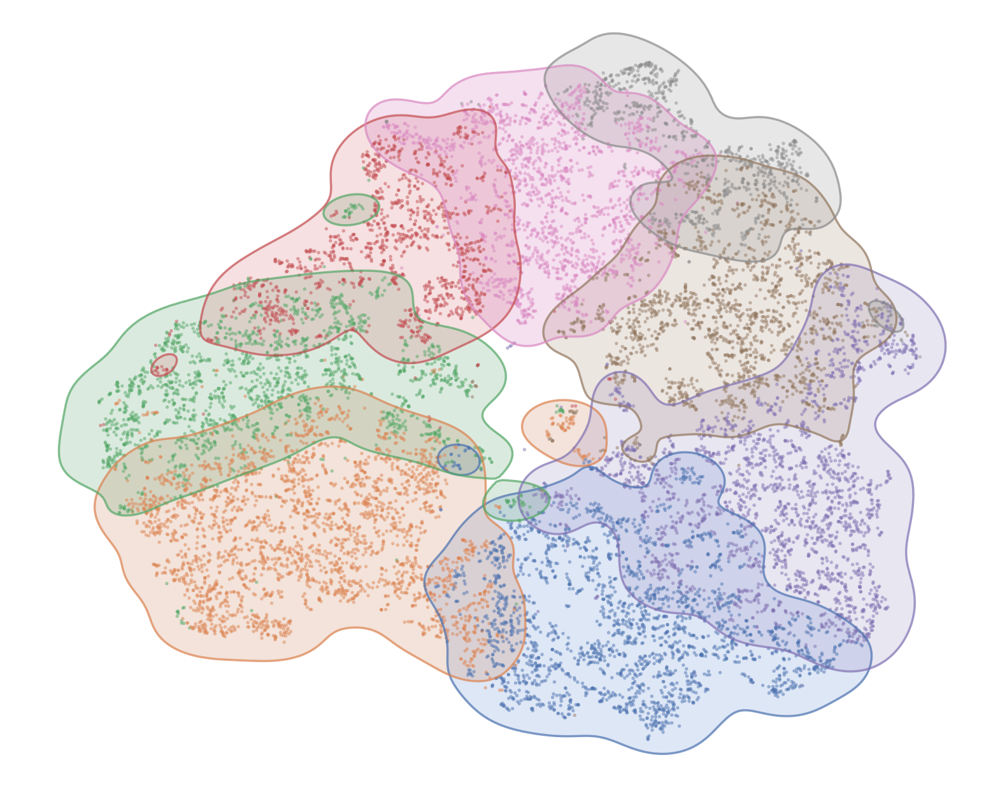

Saved Wind Speed plot to: /content\cluster_analysis_wind_speed_distribution.png


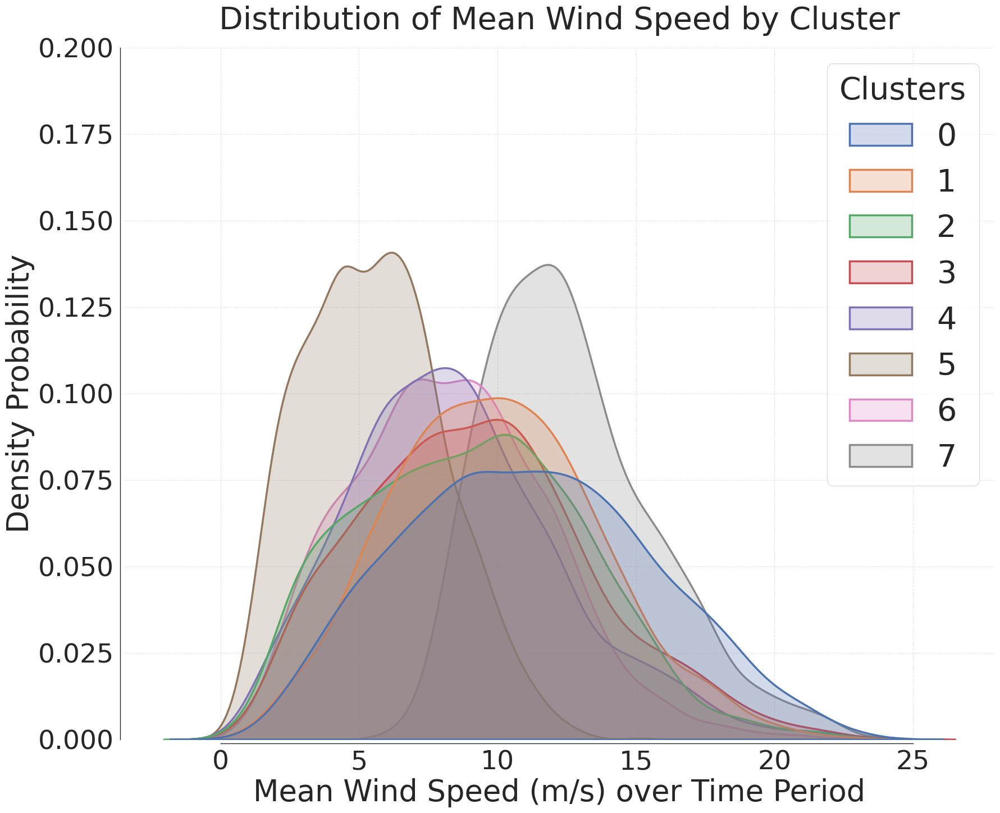

Saved Wind Rose plot to: /content\cluster_analysis_wind_roses.png


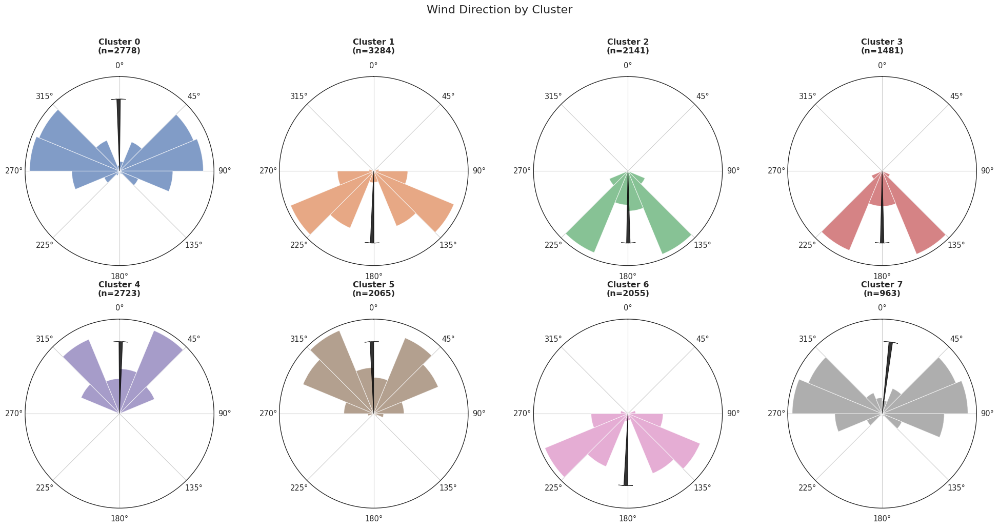


MODEL TRAINING (ROBUST SOURCE)

Cluster 0: 2242 periods, 11210 samples, 20 features
Cluster 1: 2653 periods, 13265 samples, 20 features
Cluster 2: 1713 periods, 8565 samples, 20 features
Cluster 3: 1197 periods, 5985 samples, 20 features
Cluster 4: 2162 periods, 10810 samples, 20 features
Cluster 5: 1662 periods, 8310 samples, 20 features
Cluster 6: 1611 periods, 8055 samples, 20 features
Cluster 7: 752 periods, 3760 samples, 20 features
Cluster 0: 536 periods, 2680 samples, 20 features
Cluster 1: 631 periods, 3155 samples, 20 features
Cluster 2: 428 periods, 2140 samples, 20 features
Cluster 3: 284 periods, 1420 samples, 20 features
Cluster 4: 561 periods, 2805 samples, 20 features
Cluster 5: 403 periods, 2015 samples, 20 features
Cluster 6: 444 periods, 2220 samples, 20 features
Cluster 7: 211 periods, 1055 samples, 20 features
Cleaning datasets for NaN values...
  Cluster 0 (Train): Dropped 12 NaN samples.
  Cluster 1 (Train): Dropped 6 NaN samples.
Dataset cleaning complete.


Tra

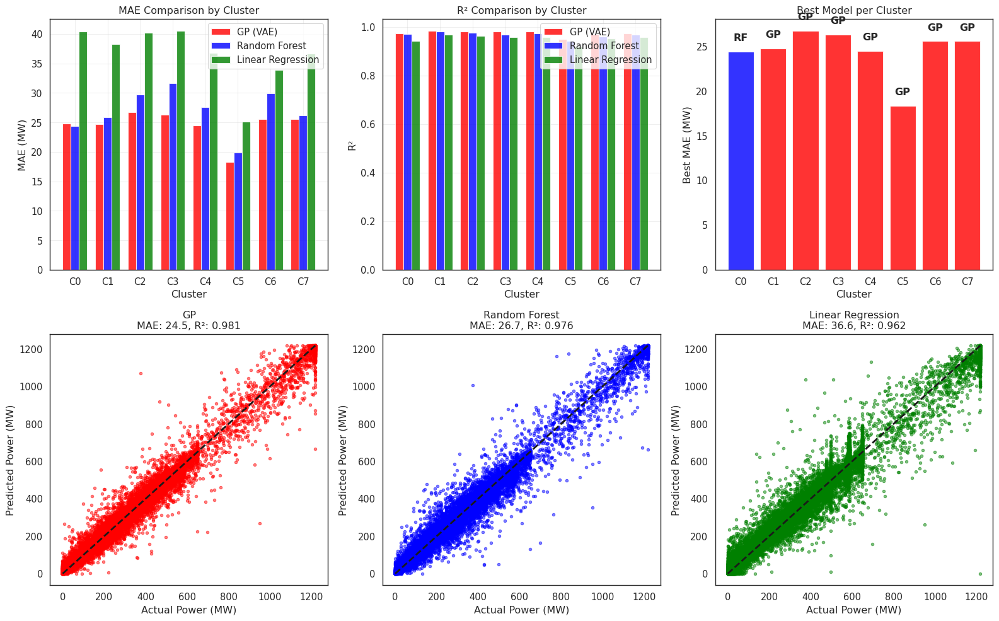


Creating prediction plots for 8 clusters...
Displaying first 72 hours of predictions


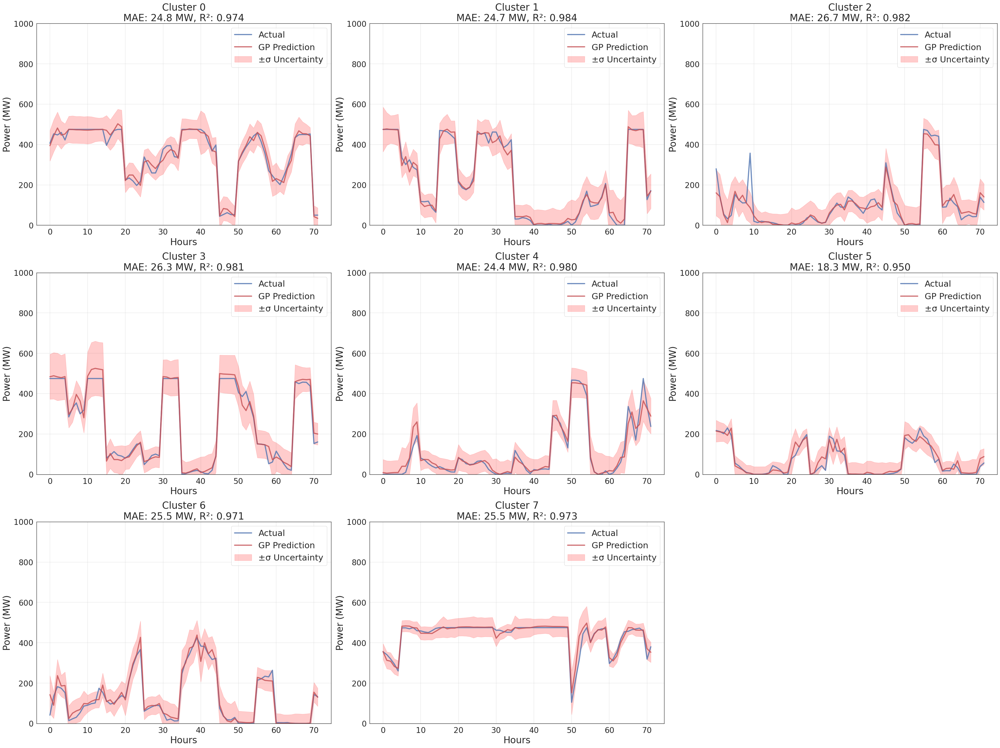


Prediction Plot Summary:
Cluster 0: MAE=24.8 MW, R²=0.974 (2680 test points)
Cluster 1: MAE=24.7 MW, R²=0.984 (3155 test points)
Cluster 2: MAE=26.7 MW, R²=0.982 (2140 test points)
Cluster 3: MAE=26.3 MW, R²=0.981 (1420 test points)
Cluster 4: MAE=24.4 MW, R²=0.980 (2805 test points)
Cluster 5: MAE=18.3 MW, R²=0.950 (2015 test points)
Cluster 6: MAE=25.5 MW, R²=0.971 (2220 test points)
Cluster 7: MAE=25.5 MW, R²=0.973 (1055 test points)
Spider diagram saved to /content\spider_mae_by_farm.png


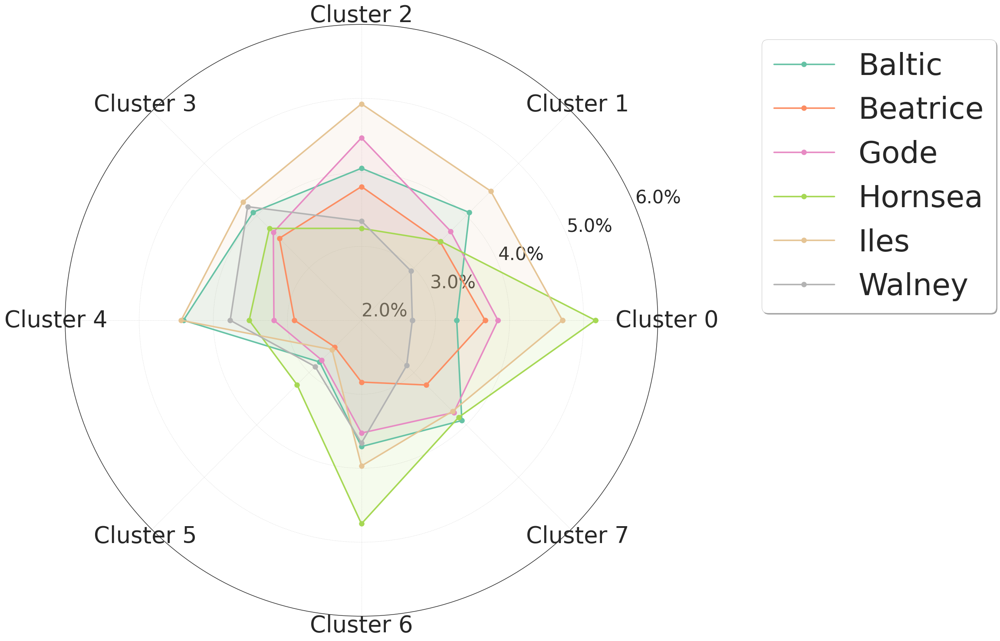

In [ ]:
results = run_complete_pipeline(df, time_period_grid=[6], k_clusters_grid=[8],
                                latent_dim=8, test_ratio=0.2, epochs=200, random_state=42, device='cpu', save_results=True, save_dir=r"/content")

Device: cuda
GPU: NVIDIA A100-SXM4-80GB
Memory: 85.2 GB

OPTIMAL CONFIGURATION SEARCH


Processing 6h periods...
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2918 periods (skipped 1 discontinuous blocks)
  Full: (2918, 18, 6), VAE: (2918, 6, 6)
  Filtered 'Turn Off' events: Dropped 5 rows
  Extracted: 2916 periods (skipped 3 discontinuous blocks)
  Full: (2916, 18, 6), VAE: (2916, 6, 6)
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2917 periods (skipped 2 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
  Filtered 'Turn Off' events: Dropped 9 rows
  Extracted: 2917 periods (skipped 1 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
  Filtered 'Turn Off' events: Dropped 16 rows
  Extracted: 2912 periods (skipped 5 discontinuous blocks)
  Full: (2912, 18, 6), VAE: (2912, 6, 6)
  Filtered 'Turn Off' events: Dropped 15 rows
  Extracted: 2910 periods (skipped 7 discontinuous blocks)
  Full: (2910, 18, 6), VAE: (2910, 6, 6)
Timeseries rand

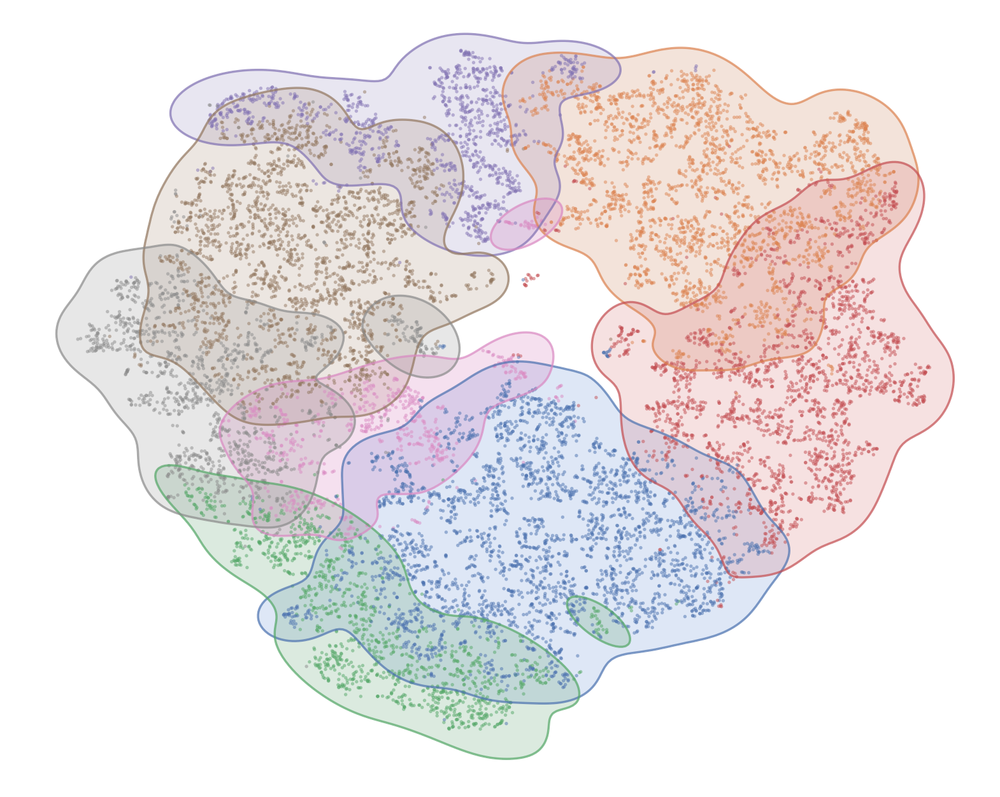

Saved Wind Speed plot to: /content\cluster_analysis_wind_speed_distribution.png


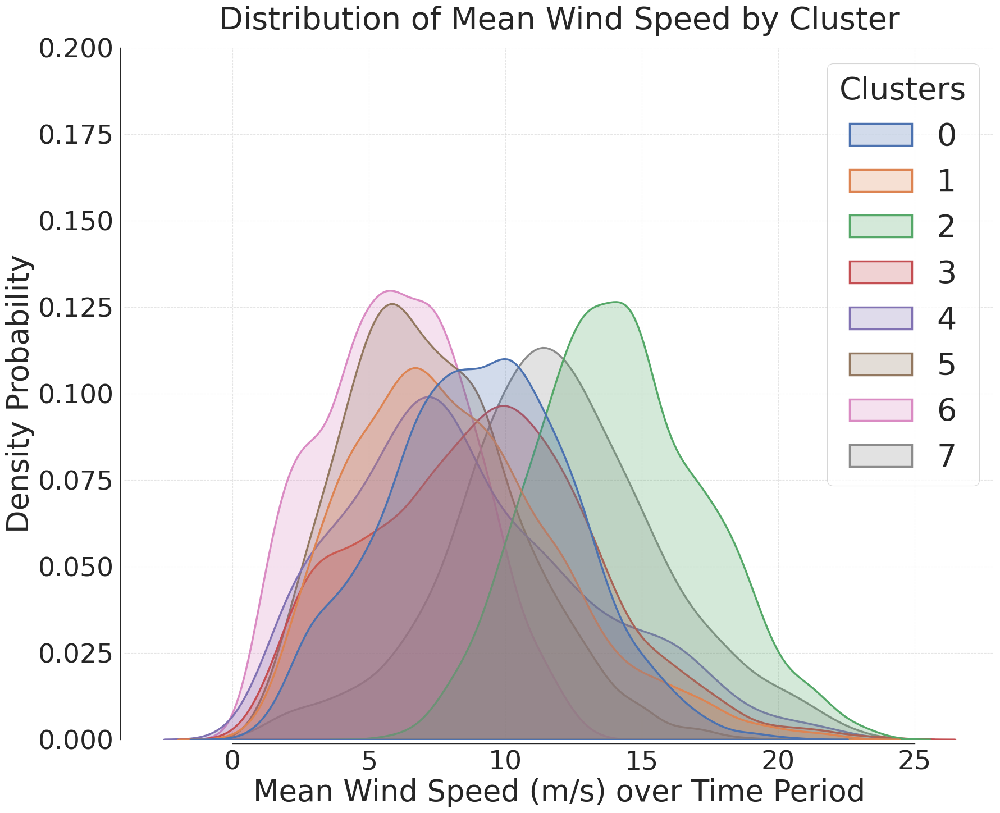

Saved Wind Rose plot to: /content\cluster_analysis_wind_roses.png


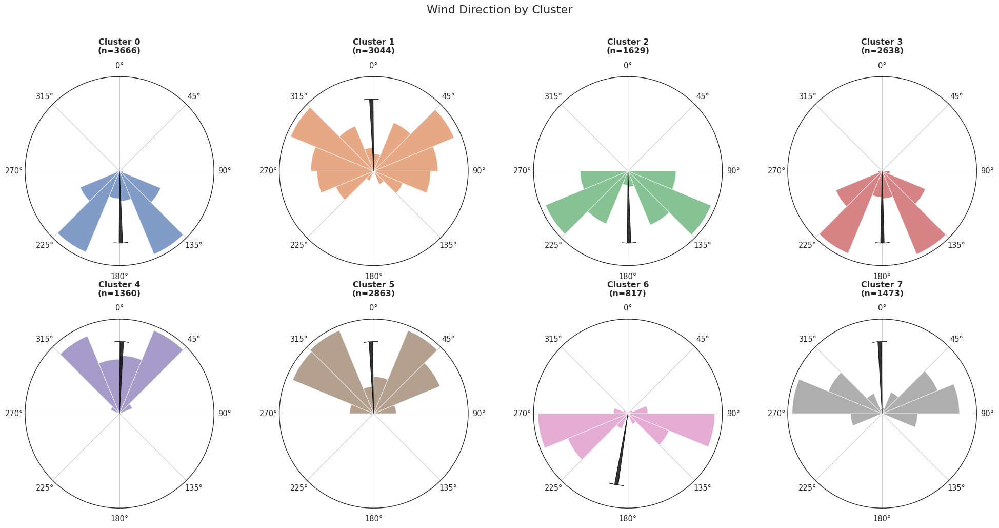


MODEL TRAINING

Cluster 0: 3005 periods, 15025 samples, 20 features
Cluster 1: 2447 periods, 12235 samples, 20 features
Cluster 2: 1250 periods, 6250 samples, 20 features
Cluster 3: 2152 periods, 10760 samples, 20 features
Cluster 4: 1079 periods, 5395 samples, 20 features
Cluster 5: 2308 periods, 11540 samples, 20 features
Cluster 6: 583 periods, 2915 samples, 20 features
Cluster 7: 1168 periods, 5840 samples, 20 features
Cluster 0: 661 periods, 3305 samples, 20 features
Cluster 1: 597 periods, 2985 samples, 20 features
Cluster 2: 379 periods, 1895 samples, 20 features
Cluster 3: 486 periods, 2430 samples, 20 features
Cluster 4: 281 periods, 1405 samples, 20 features
Cluster 5: 555 periods, 2775 samples, 20 features
Cluster 6: 234 periods, 1170 samples, 20 features
Cluster 7: 305 periods, 1525 samples, 20 features
Cleaning datasets for NaN values...
  Cluster 2 (Train): Dropped 6 NaN samples.
  Cluster 5 (Train): Dropped 3 NaN samples.
  Cluster 0 (Test): Dropped 3 NaN samples.
  Clu

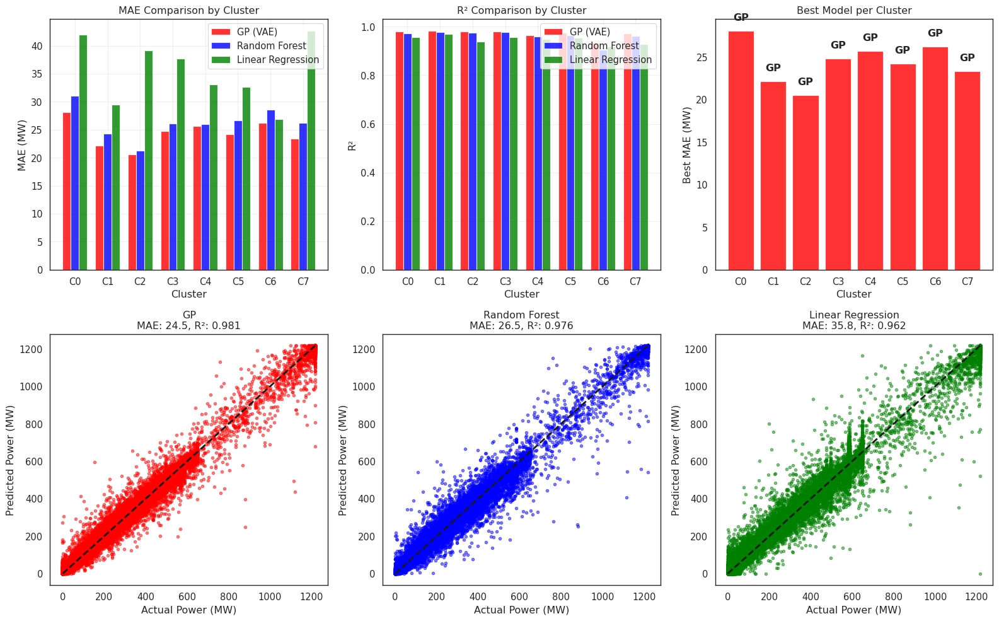


Creating prediction plots for 8 clusters...
Displaying first 72 hours of predictions


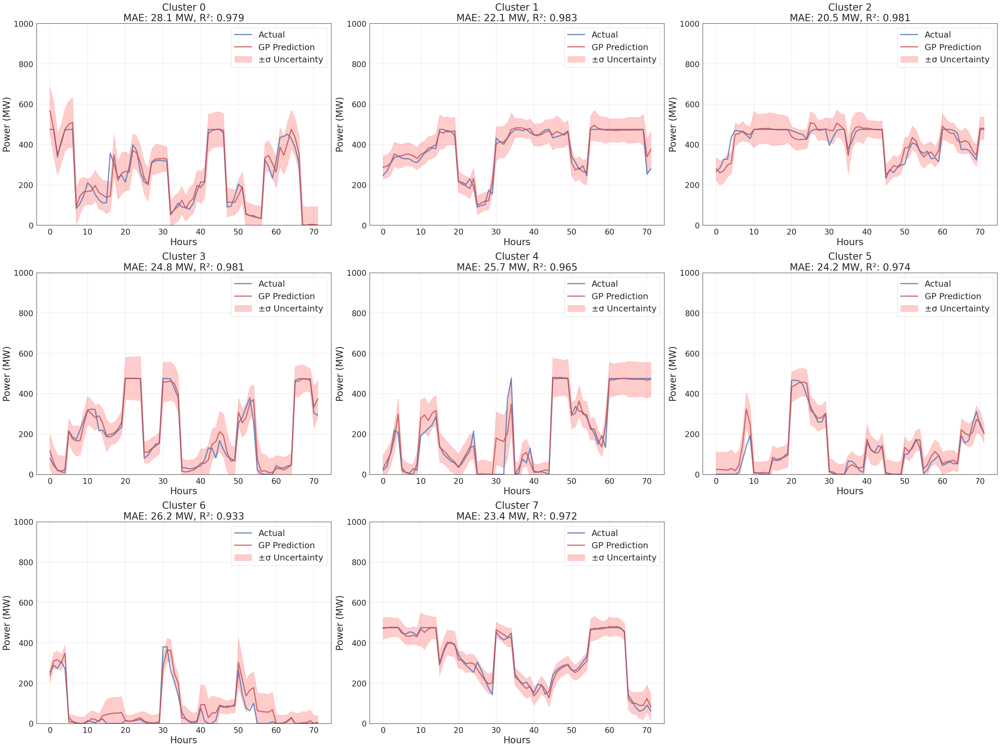


Prediction Plot Summary:
Cluster 0: MAE=28.1 MW, R²=0.979 (3302 test points)
Cluster 1: MAE=22.1 MW, R²=0.983 (2985 test points)
Cluster 2: MAE=20.5 MW, R²=0.981 (1889 test points)
Cluster 3: MAE=24.8 MW, R²=0.981 (2430 test points)
Cluster 4: MAE=25.7 MW, R²=0.965 (1405 test points)
Cluster 5: MAE=24.2 MW, R²=0.974 (2775 test points)
Cluster 6: MAE=26.2 MW, R²=0.933 (1170 test points)
Cluster 7: MAE=23.4 MW, R²=0.972 (1525 test points)
Spider diagram saved to /content\spider_mae_by_farm.png


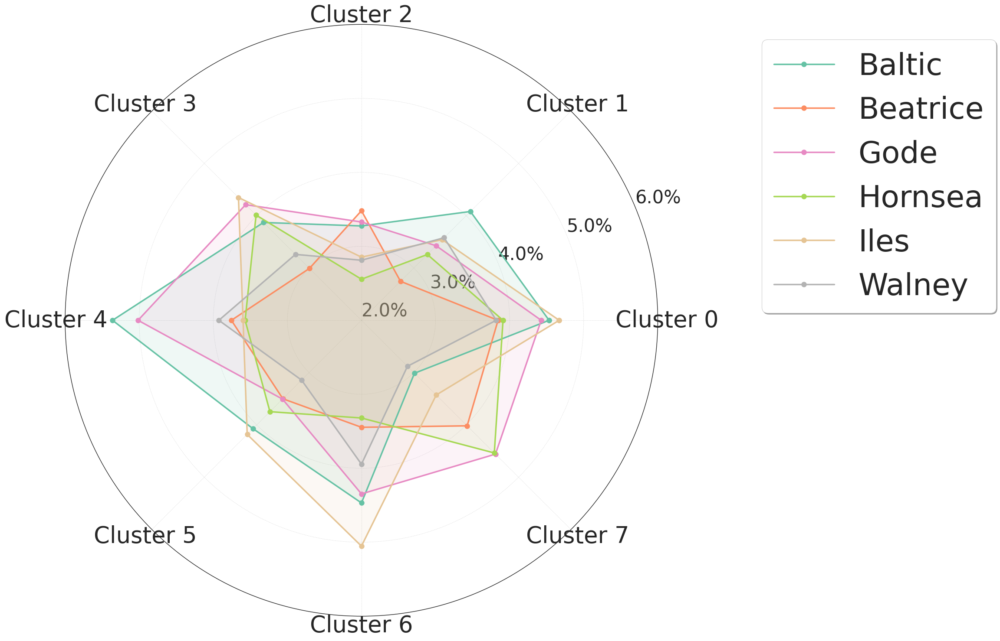

In [ ]:
results = run_complete_pipeline(df, time_period_grid=[6], k_clusters_grid=[8],
                                latent_dim=8, test_ratio=0.2, epochs=200, random_state=63, device='cpu', save_results=True, save_dir=r"/content")

Device: cuda
GPU: NVIDIA A100-SXM4-80GB
Memory: 85.2 GB

OPTIMAL CONFIGURATION SEARCH


Processing 6h periods...
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2918 periods (skipped 1 discontinuous blocks)
  Full: (2918, 18, 6), VAE: (2918, 6, 6)
  Filtered 'Turn Off' events: Dropped 5 rows
  Extracted: 2916 periods (skipped 3 discontinuous blocks)
  Full: (2916, 18, 6), VAE: (2916, 6, 6)
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2917 periods (skipped 2 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
  Filtered 'Turn Off' events: Dropped 9 rows
  Extracted: 2917 periods (skipped 1 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
  Filtered 'Turn Off' events: Dropped 16 rows
  Extracted: 2912 periods (skipped 5 discontinuous blocks)
  Full: (2912, 18, 6), VAE: (2912, 6, 6)
  Filtered 'Turn Off' events: Dropped 15 rows
  Extracted: 2910 periods (skipped 7 discontinuous blocks)
  Full: (2910, 18, 6), VAE: (2910, 6, 6)
Timeseries rand

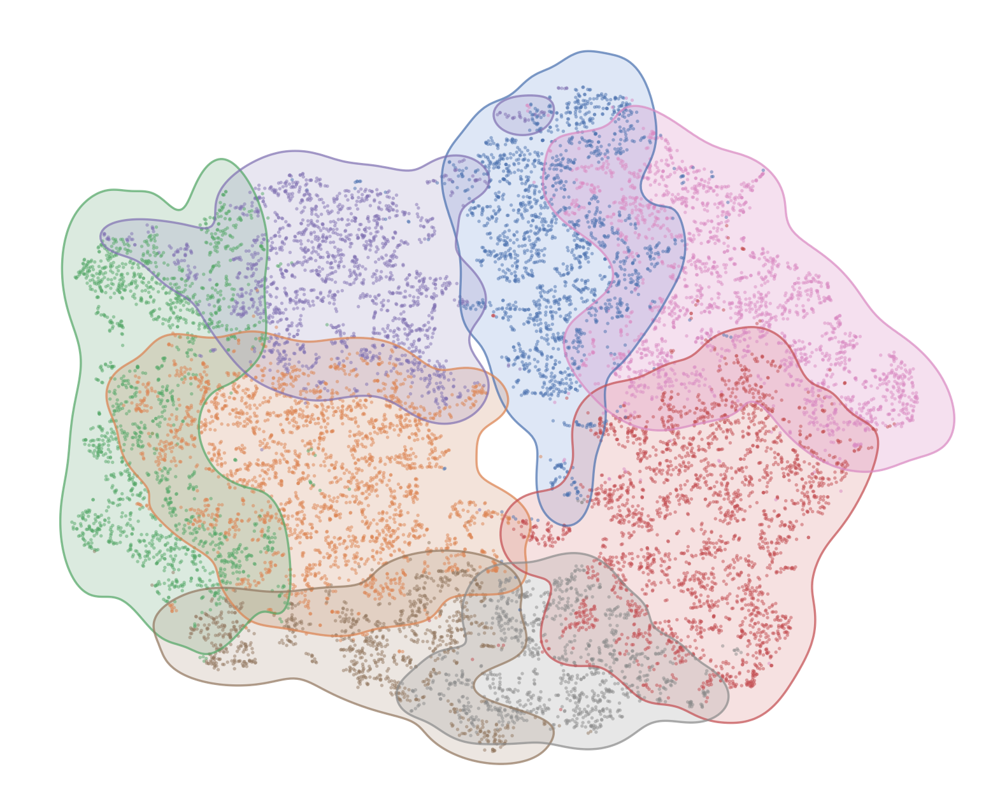

Saved Wind Speed plot to: /content\cluster_analysis_wind_speed_distribution.png


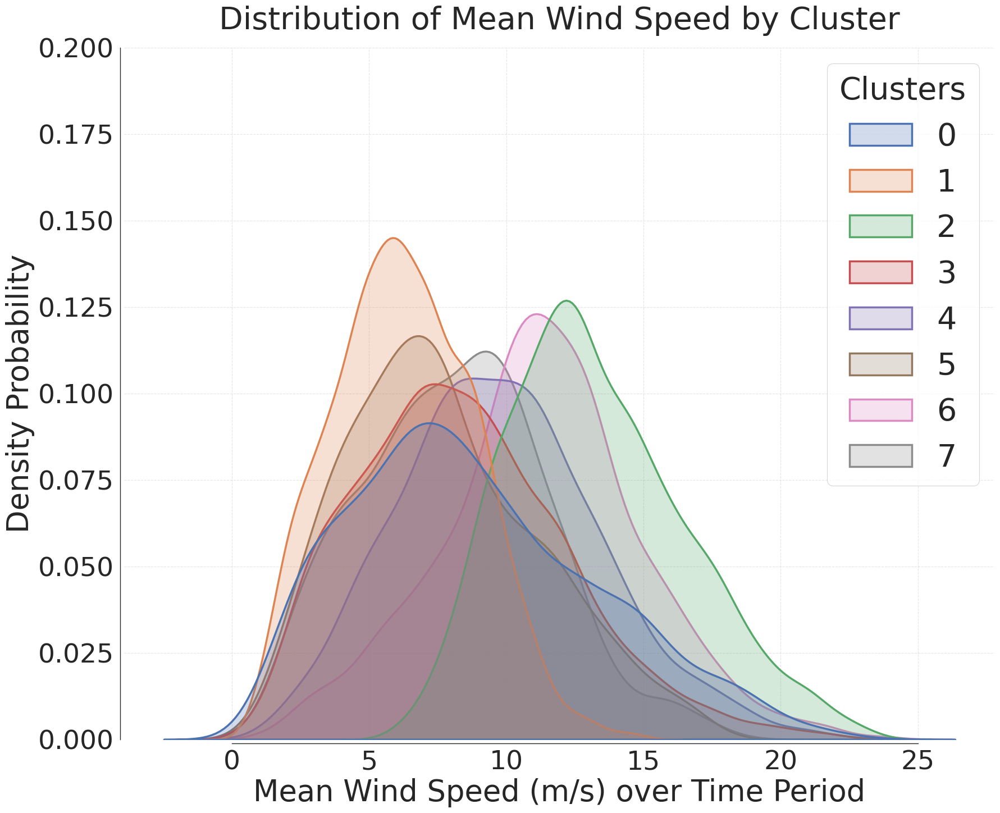

Saved Wind Rose plot to: /content\cluster_analysis_wind_roses.png


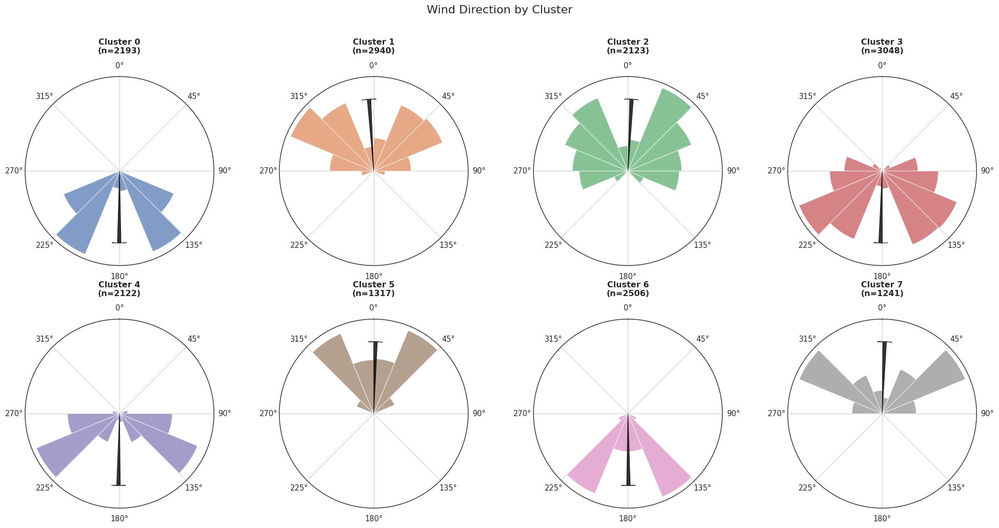


MODEL TRAINING

Cluster 0: 1781 periods, 8905 samples, 20 features
Cluster 1: 2461 periods, 12305 samples, 20 features
Cluster 2: 1664 periods, 8320 samples, 20 features
Cluster 3: 2481 periods, 12405 samples, 20 features
Cluster 4: 1652 periods, 8260 samples, 20 features
Cluster 5: 973 periods, 4865 samples, 20 features
Cluster 6: 2010 periods, 10050 samples, 20 features
Cluster 7: 970 periods, 4850 samples, 20 features
Cluster 0: 412 periods, 2060 samples, 20 features
Cluster 1: 479 periods, 2395 samples, 20 features
Cluster 2: 459 periods, 2295 samples, 20 features
Cluster 3: 567 periods, 2835 samples, 20 features
Cluster 4: 470 periods, 2350 samples, 20 features
Cluster 5: 344 periods, 1720 samples, 20 features
Cluster 6: 496 periods, 2480 samples, 20 features
Cluster 7: 271 periods, 1355 samples, 20 features
Cleaning datasets for NaN values...
  Cluster 1 (Train): Dropped 3 NaN samples.
  Cluster 4 (Train): Dropped 6 NaN samples.
  Cluster 6 (Train): Dropped 3 NaN samples.
  Clus

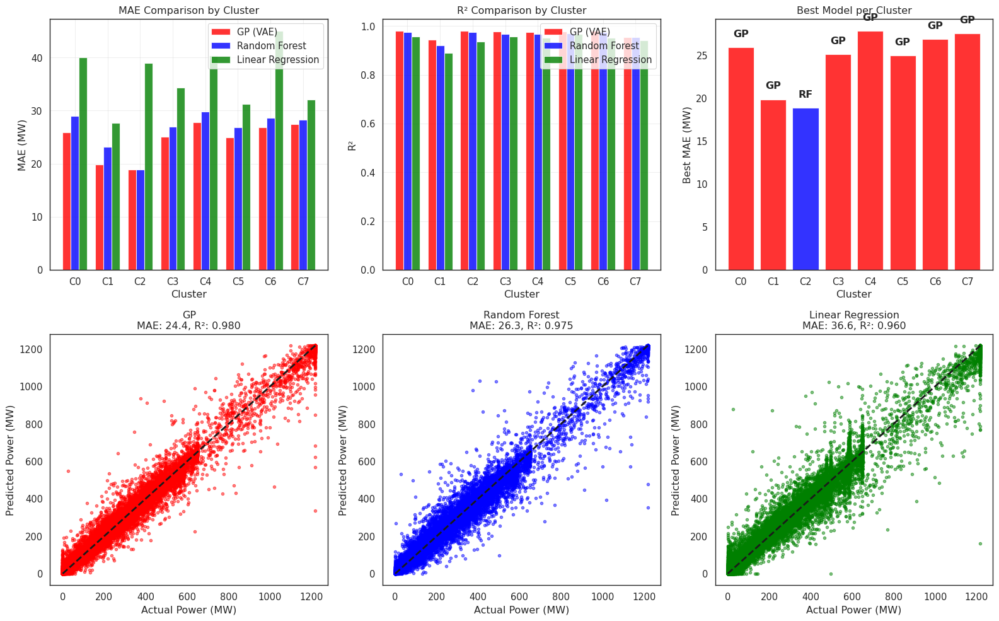


Creating prediction plots for 8 clusters...
Displaying first 72 hours of predictions


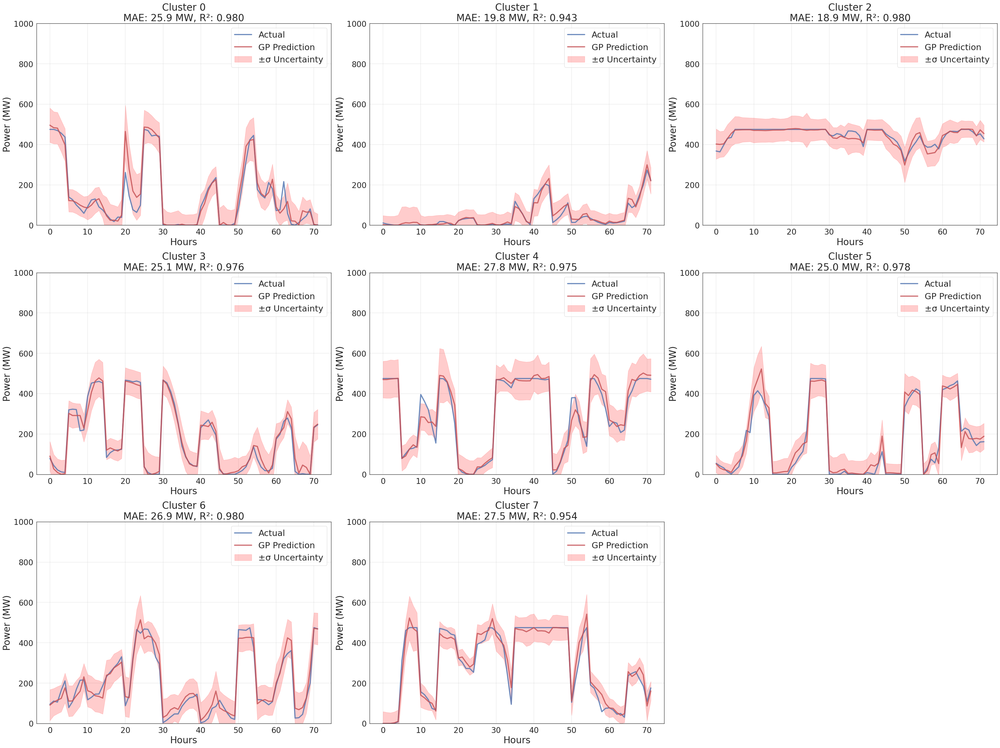


Prediction Plot Summary:
Cluster 0: MAE=25.9 MW, R²=0.980 (2057 test points)
Cluster 1: MAE=19.8 MW, R²=0.943 (2395 test points)
Cluster 2: MAE=18.9 MW, R²=0.980 (2292 test points)
Cluster 3: MAE=25.1 MW, R²=0.976 (2835 test points)
Cluster 4: MAE=27.8 MW, R²=0.975 (2350 test points)
Cluster 5: MAE=25.0 MW, R²=0.978 (1720 test points)
Cluster 6: MAE=26.9 MW, R²=0.980 (2480 test points)
Cluster 7: MAE=27.5 MW, R²=0.954 (1355 test points)
Spider diagram saved to /content\spider_mae_by_farm.png


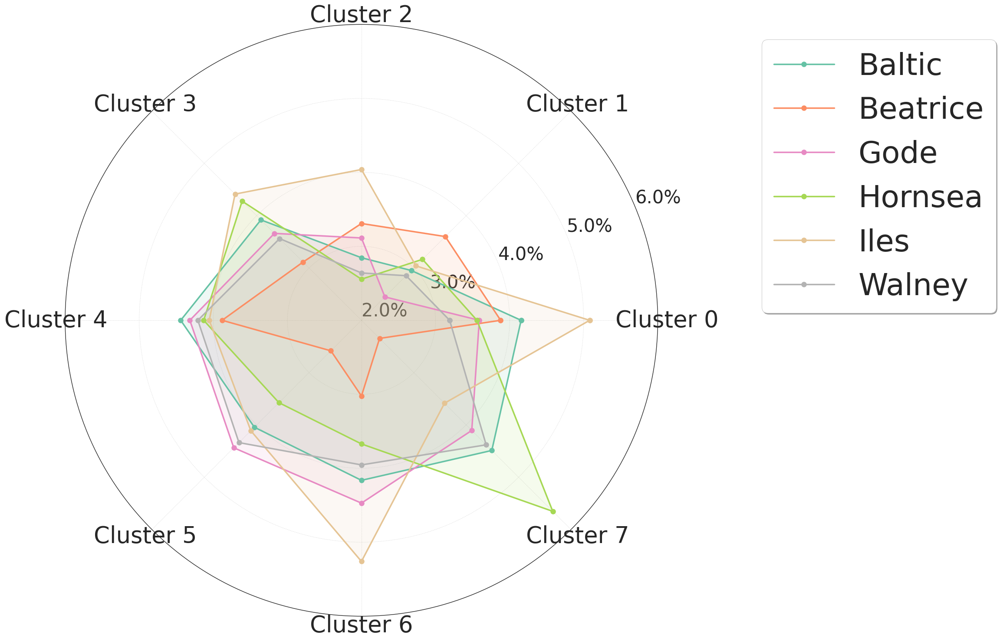

In [35]:
results = run_complete_pipeline(df, time_period_grid=[6], k_clusters_grid=[8],
                                latent_dim=8, test_ratio=0.2, epochs=200, random_state=84, device='cpu', save_results=True, save_dir=r"/content")

Device: cuda
GPU: Tesla T4
Memory: 15.8 GB

OPTIMAL CONFIGURATION SEARCH


Processing 6h periods...
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2918 periods (skipped 1 discontinuous blocks)
  Full: (2918, 18, 6), VAE: (2918, 6, 6)
  Filtered 'Turn Off' events: Dropped 5 rows
  Extracted: 2916 periods (skipped 3 discontinuous blocks)
  Full: (2916, 18, 6), VAE: (2916, 6, 6)
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2917 periods (skipped 2 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
  Filtered 'Turn Off' events: Dropped 9 rows
  Extracted: 2917 periods (skipped 1 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
  Filtered 'Turn Off' events: Dropped 16 rows
  Extracted: 2912 periods (skipped 5 discontinuous blocks)
  Full: (2912, 18, 6), VAE: (2912, 6, 6)
  Filtered 'Turn Off' events: Dropped 15 rows
  Extracted: 2910 periods (skipped 7 discontinuous blocks)
  Full: (2910, 18, 6), VAE: (2910, 6, 6)
Timeseries randomly split in

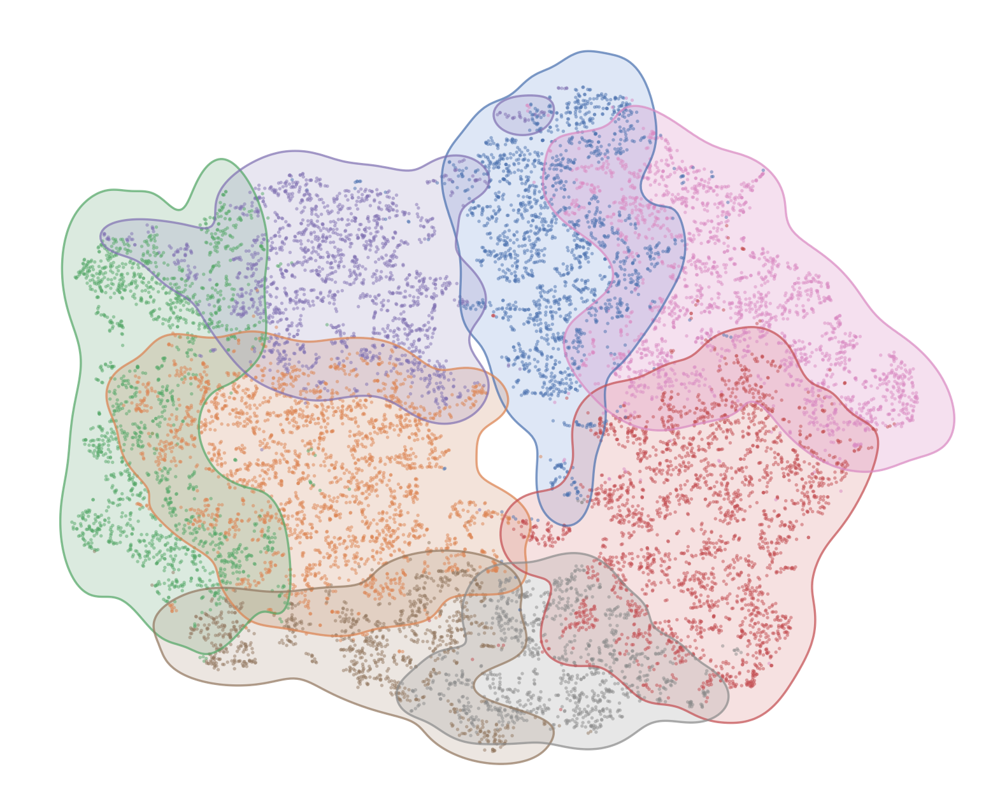

Saved Wind Speed plot to: /content/cluster_analysis_wind_speed_distribution.png


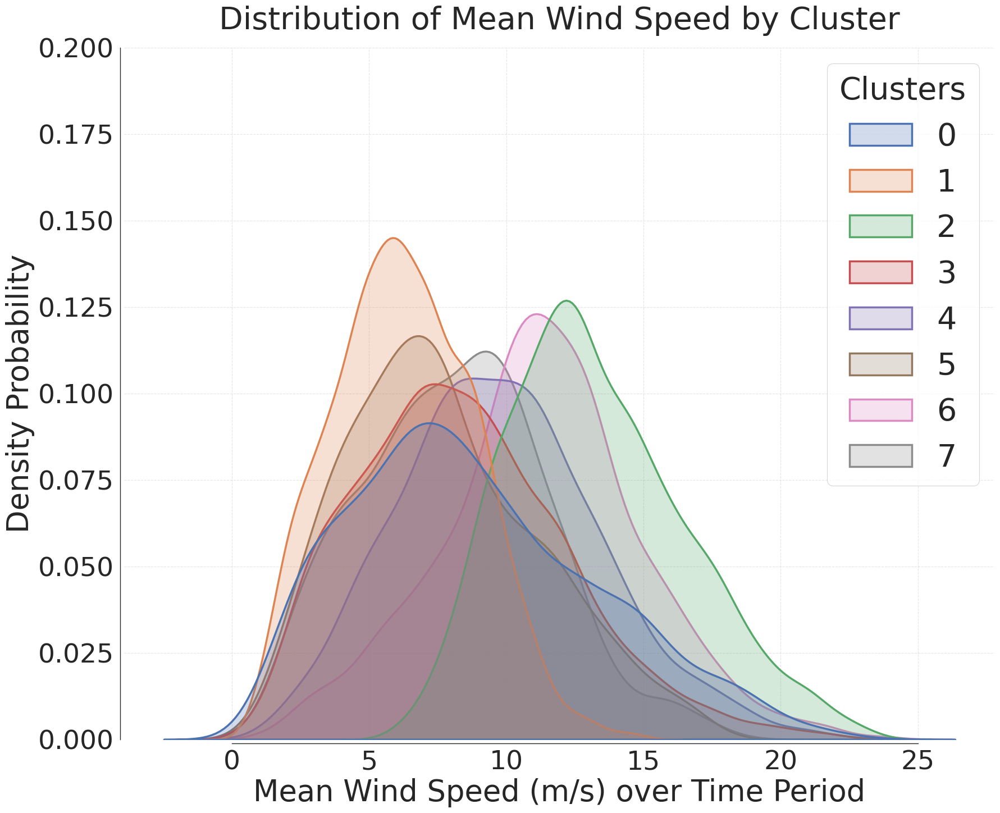

Saved Wind Rose plot to: /content/cluster_analysis_wind_roses.png


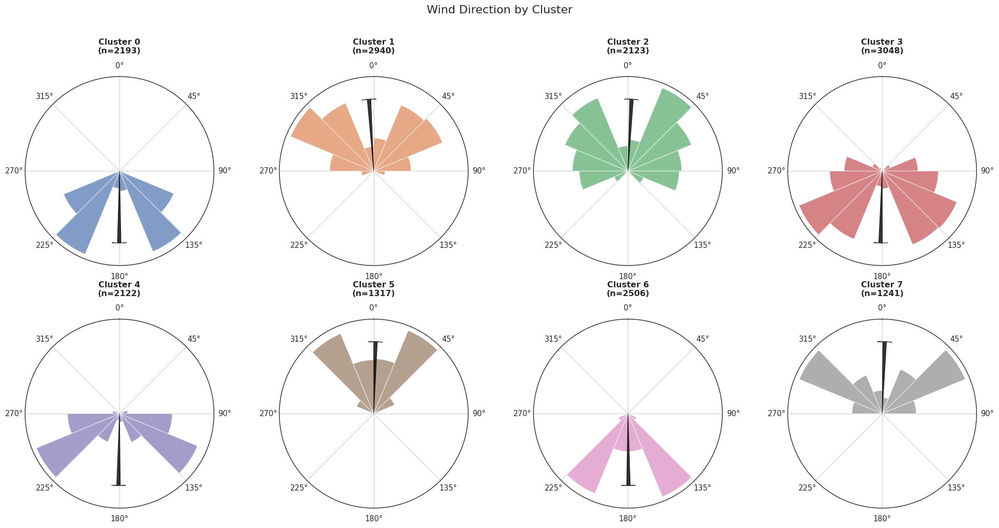


MODEL TRAINING

Cluster 0: 1781 periods, 8905 samples, 20 features
Cluster 1: 2461 periods, 12305 samples, 20 features
Cluster 2: 1664 periods, 8320 samples, 20 features
Cluster 3: 2481 periods, 12405 samples, 20 features
Cluster 4: 1652 periods, 8260 samples, 20 features
Cluster 5: 973 periods, 4865 samples, 20 features
Cluster 6: 2010 periods, 10050 samples, 20 features
Cluster 7: 970 periods, 4850 samples, 20 features
Cluster 0: 412 periods, 2060 samples, 20 features
Cluster 1: 479 periods, 2395 samples, 20 features
Cluster 2: 459 periods, 2295 samples, 20 features
Cluster 3: 567 periods, 2835 samples, 20 features
Cluster 4: 470 periods, 2350 samples, 20 features
Cluster 5: 344 periods, 1720 samples, 20 features
Cluster 6: 496 periods, 2480 samples, 20 features
Cluster 7: 271 periods, 1355 samples, 20 features
Cleaning datasets for NaN values...
  Cluster 1 (Train): Dropped 3 NaN samples.
  Cluster 4 (Train): Dropped 6 NaN samples.
  Cluster 6 (Train): Dropped 3 NaN samples.
  Clus

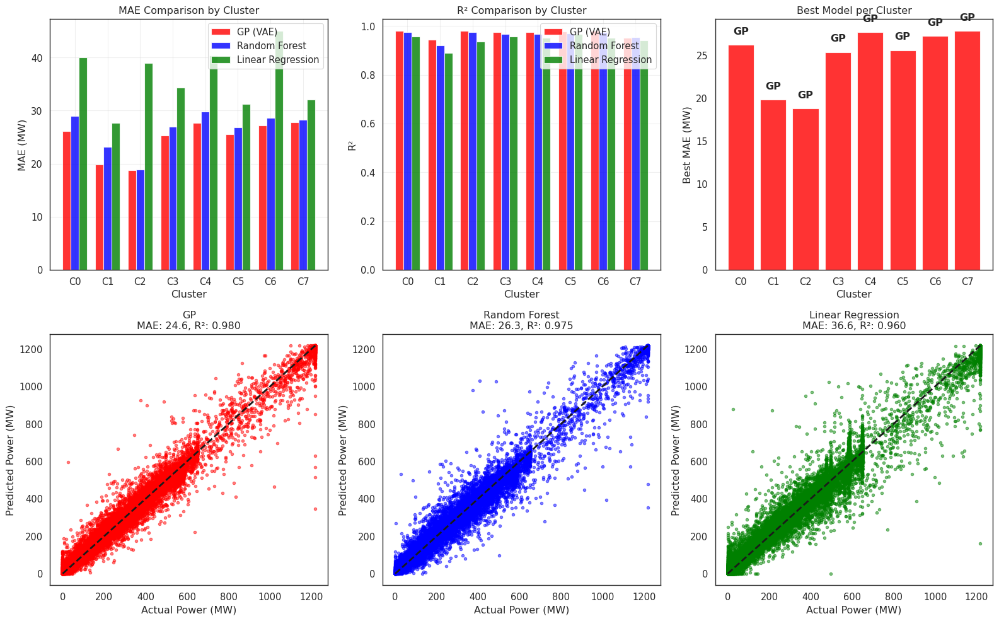


Creating prediction plots for 8 clusters...
Displaying first 72 hours of predictions


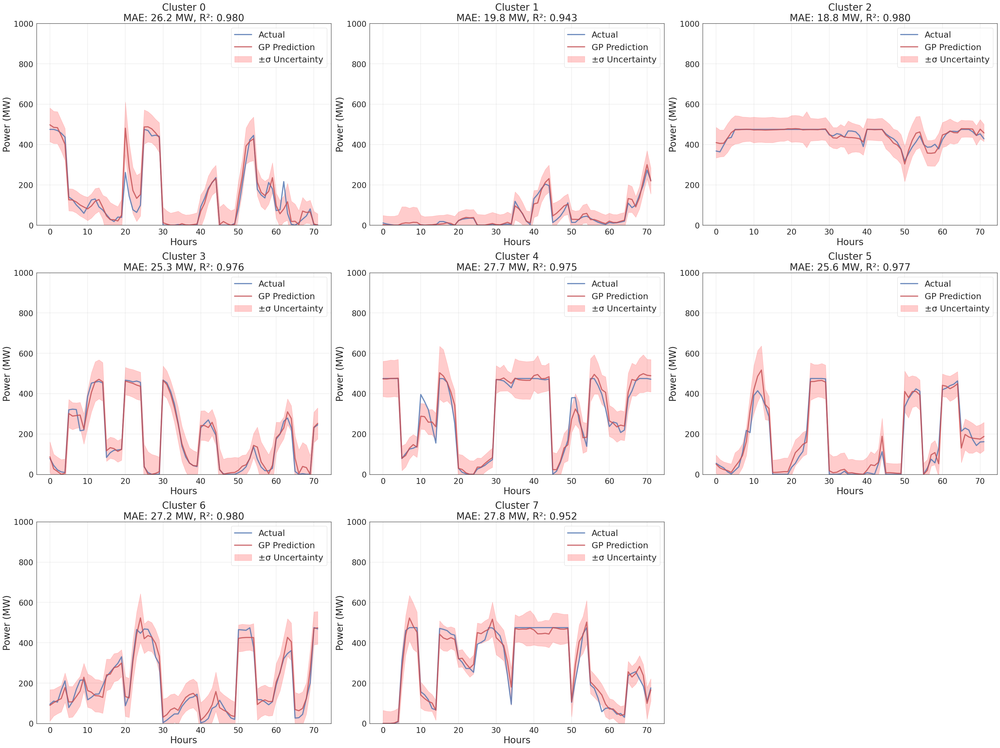


Prediction Plot Summary:
Cluster 0: MAE=26.2 MW, R²=0.980 (2057 test points)
Cluster 1: MAE=19.8 MW, R²=0.943 (2395 test points)
Cluster 2: MAE=18.8 MW, R²=0.980 (2292 test points)
Cluster 3: MAE=25.3 MW, R²=0.976 (2835 test points)
Cluster 4: MAE=27.7 MW, R²=0.975 (2350 test points)
Cluster 5: MAE=25.6 MW, R²=0.977 (1720 test points)
Cluster 6: MAE=27.2 MW, R²=0.980 (2480 test points)
Cluster 7: MAE=27.8 MW, R²=0.952 (1355 test points)
Spider diagram saved to /content/spider_mae_by_farm.png


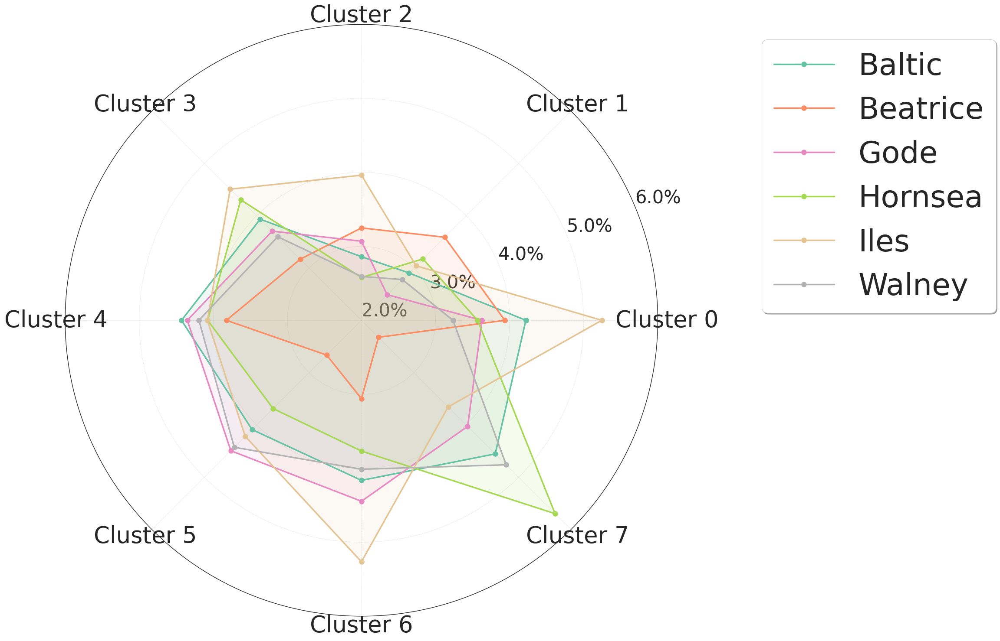

In [35]:
results = run_complete_pipeline(df, time_period_grid=[6], k_clusters_grid=[8],
                                latent_dim=8, test_ratio=0.2, epochs=200, random_state=84, device='cpu', save_results=True, save_dir=r"/content")

In [79]:
results = run_complete_pipeline(df, time_period_grid=[6, 12, 24, 36, 48], k_clusters_grid=[6, 8, 10, 12, 14],
                                latent_dim=8, test_ratio=0.2, epochs=200, random_state=84, device='cpu', save_results=False, save_dir=r"/content")

Device: cuda
GPU: Tesla T4
Memory: 15.8 GB

OPTIMAL CONFIGURATION SEARCH


Processing 6h periods...
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2918 periods (skipped 1 discontinuous blocks)
  Full: (2918, 18, 6), VAE: (2918, 6, 6)
  Filtered 'Turn Off' events: Dropped 5 rows
  Extracted: 2916 periods (skipped 3 discontinuous blocks)
  Full: (2916, 18, 6), VAE: (2916, 6, 6)
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2917 periods (skipped 2 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
  Filtered 'Turn Off' events: Dropped 9 rows
  Extracted: 2917 periods (skipped 1 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
  Filtered 'Turn Off' events: Dropped 16 rows
  Extracted: 2912 periods (skipped 5 discontinuous blocks)
  Full: (2912, 18, 6), VAE: (2912, 6, 6)
  Filtered 'Turn Off' events: Dropped 15 rows
  Extracted: 2910 periods (skipped 7 discontinuous blocks)
  Full: (2910, 18, 6), VAE: (2910, 6, 6)
Timeseries randomly split in

KeyboardInterrupt: 